# Capstone Two - 11.5 Exploratory Data Analysis

*longer plotting operations have a `%%time` on their cells, that way a reader can consider looking at the locally saved graph instead of repeating the operation*



### Rubric/Guide



#### Objectives
 - > Understand the importance of performing EDA.
 - > Apply data wrangling techniques, as laid out in the DSM building data profiles, tables, and figures to evaluate the feature relationships
 - > Identify the features that are likely to have the most impact in modeling based on relationships between the features and the response variable

#### Completion
 - every feature investigated with histogram, bi-plots, other visual/numerical means
   - *done*
 - Pearson correlation coeff + other methods used to identify,quantify statistical relationships
   - **add other measures?**
#### Understanding
 - feature relationships
   - *done*
 - data-supported decisions on feature selection
   - **continue working on this, see separate markdown notes file**
#### Prsentation
 - **do final check**
   - notebook in working order
   - submit on github
   
#### Guide
 - build profiles, tables graphs
 - explore inferential statistics and data relationships
 - outlier analysis
   - Null/Alternate hypotheses, p-tests
 - feature selection and engineering
   - encode categorical features
   - binarize features/values?
   - handle missing data --> drop / replace / impute
   - transformation: standardize / normalize / log-transform



### Contents

***DO FINAL CHECK AFTER FINISHED***
- [Data Loading, Final Cleaning](#Load-Data)
  - [Simple Team Analysis](#Simple-Team-Analysis)
  - [Remove Missing Data](#Assess-"Null"-Data)
- [Target Features](#Target-Features)
  - [Home Wins, Home Margin](#Home-Win-Analysis)
  - [Distributions](#Home-Margin-Analysis)
- [Initial Exploration](#Initial-Exploration)
  - [Histograms, Regression](#Basic-Histograms,Regressions)
  - [Correlation Heatmaps](#Basic-Correlation-Heatmap)
  - [Pairplots](#Basic-Pairplots)
- [Derived Features](#Derived-Features)
  - [Histograms, Regression](#Derived-Histograms,Regressions)
  - [Correlation Heatmaps](#Derived-Correlation-Heatmap)
  - [Pairplots](#Derived-Correlation-Heatmap)
  - [Combine Data](#Combine-Basic,Derived-Features)
- Other graphing . . . 
  - [Plotly Heatmaps](#Correlation-Heatmaps-with-Plotly)
  - [Image Editing](#Pillow-Interlude)
- [Principal Component Analysis](#PCA)
- [Feature Selection](#Findings)
  - *discussion moved to separate markdown file*
- [Data Cleaning Rd 2???](#More-Data-Cleaning)
- [ydata reports](#ydata-report)

● Are there variables that are particularly significant in terms of explaining the
answer to your project question?

● Are there significant differences between subgroups in your data that may be
relevant to your project aim?

● Are there strong correlations between pairs of independent variables or between
an independent and a dependent variable?

● What are the most appropriate tests to use to analyze these relationships?

### Load Data 
 - simple exploration of team info, focus on team game statistics
 - cleanse data of previosly marked "Null" values, `-1`
   - remove seasons (years) with mostly incomplete data
     - first two years: 2012, 2013
   - *later* chop missing Huck, Redzone data (data only collected > 2019) or features entirely
     - leave for now for more complete assessment of other features
     - consider using later

In [95]:
# import libraries
# import requests
import json
import pandas as pd
from tqdm import tqdm
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path

In [90]:
# make directory for graphs
Path('graphs/EDA').mkdir(exist_ok=True)
Path('graphs/EDA/pairplots').mkdir(exist_ok=True) # big graphs, not uploaded to repo
Path('graphs/EDA/ydata').mkdir(exist_ok=True) # big reports, not uploaded to repo
Path('graphs/EDA/PCA').mkdir(exist_ok=True)

In [169]:
# load data
data = pd.read_parquet('data/clean_1/game_stats_2023-09-19.parquet')
teams = pd.read_parquet('data/clean_1/team_info_2023-09-19.parquet')


In [30]:
teams.tail()

,abbrev,city,name,primary,secondary,home,away,games,first,last,wins,losses,ties
8,NSH,Nashville,Nightwatch,<NA>,<NA>,28,28,56,2015,2018,8,48,0
28,SLC,Salt Lake,Lions,<NA>,<NA>,7,7,14,2014,2014,0,14,0
25,CHA,Charlotte,Express,<NA>,<NA>,14,14,28,2015,2016,6,22,0
98,SW,South-West,SW All-Stars,<NA>,<NA>,1,0,1,2022,2022,0,1,0
99,EC,East-Central,EC All-Stars,<NA>,<NA>,0,1,1,2022,2022,1,0,0


In [158]:
data.sample(3).iloc[:,5:].T

,2905,2189,2389
home_score,13,21,25
away_score,19,19,22
away_completions,201,244,232
away_throws,218,272,259
away_blocks,6,6,17
away_turnovers,17,28,27
away_o_scores,14,16,19
away_o_points,15,23,28
away_o_possessions,24,32,42
away_d_scores,5,3,3


#### Simple Team Analysis
- make cool timeline of teams, when they were active.
  - add labels with info (win% or something)

In [3]:
teams.sample(4)

,abbrev,city,name,primary,secondary,home,away,games,first,last,wins,losses,ties
38,POR,Portland,Nitro,#FD4C0C,#82D9D4,12,12,24,2022,2023,3,21,0
18,CAR,Carolina,Flyers,#003049,#C0C0C0,57,60,117,2015,2023,85,32,0
11,MAD,Madison,Radicals,#003A5C,#ACA300,78,71,149,2013,2023,109,40,0
21,OAK,Oakland,Spiders,#FEBD25,#000000,64,61,125,2014,2023,66,59,0


In [4]:
# current teams
teams[teams['last']==2023].shape

(24, 13)

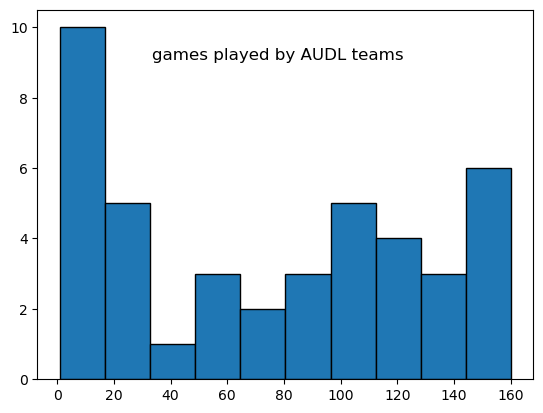

In [5]:
teams.games.hist(edgecolor='k')
plt.suptitle('games played by AUDL teams',y=0.8)
plt.grid(False)
plt.show()

In [ ]:
# Historical Teams Calendar

#### Assess "Null" Data
##### AKA `=-1` 

In [45]:
data[data==-1].groupby(data.date.dt.year).sum(numeric_only =True).T.style\
    .background_gradient(cmap='Spectral', axis=None)\
    .format(formatter="{:.0f}")

date,2012,2013,2014,2015,2016,2017,2018,2019,2021,2022,2023
location,0,0,0,0,0,0,0,0,0,0,0
home_score,0,0,0,0,0,0,0,0,0,0,0
away_score,0,0,0,0,0,0,0,0,0,0,0
away_completions,-34,-17,-2,-2,-2,0,0,0,0,0,0
away_throws,-34,-17,-2,-2,-2,0,0,0,0,0,0
away_hucks_completed,-64,-101,-126,-185,-193,-179,-171,-132,0,0,0
away_hucks,-64,-101,-126,-185,-193,-179,-171,-132,0,0,0
away_blocks,0,0,0,0,0,0,0,0,0,0,0
away_turnovers,0,0,0,0,0,0,0,0,0,0,0
away_o_scores,-64,-101,-1,-2,-2,0,0,0,0,0,0


##### Remove 2012-2013

In [170]:
print(data.shape)
data = data[data.date.dt.year > 2013]
print('removed 2012,2013 seasons')
print(data.shape)

(1604, 37)
removed 2012,2013 seasons
(1439, 37)


In [47]:
data[data==-1].groupby(data.date.dt.year).sum(numeric_only =True).T.style\
    .background_gradient(cmap='Spectral', axis=None)\
    .format(formatter="{:.0f}")

date,2014,2015,2016,2017,2018,2019,2021,2022,2023
location,0,0,0,0,0,0,0,0,0
home_score,0,0,0,0,0,0,0,0,0
away_score,0,0,0,0,0,0,0,0,0
away_completions,-2,-2,-2,0,0,0,0,0,0
away_throws,-2,-2,-2,0,0,0,0,0,0
away_hucks_completed,-126,-185,-193,-179,-171,-132,0,0,0
away_hucks,-126,-185,-193,-179,-171,-132,0,0,0
away_blocks,0,0,0,0,0,0,0,0,0
away_turnovers,0,0,0,0,0,0,0,0,0
away_o_scores,-1,-2,-2,0,0,0,0,0,0


##### Rest of missing values
- drop "new" features, only recorded 2021 and beyond
  - hucks and redzone
- drop incomplete games
  - handful from 2014,2015,2016
  - `{2182, 1514, 1516, 1709, 1752, 2109}`
- drop purely descriptive features, will not be used for model training
  - location, timezone
  - date, game, week, home/away team kept for labels

In [171]:
print(data.shape)
data.drop(columns = ['away_hucks_completed', 'away_hucks', 'away_rz_scores', 'away_rz_possessions',
                     'home_hucks_completed', 'home_hucks','home_rz_scores', 'home_rz_possessions',
                     'location', 'tz',], inplace=True)
print('after feature removal')
print(data.shape)

(1439, 37)
after feature removal
(1439, 27)


In [172]:
ind = []
for col in data.columns[7:]:
    ind.extend(data[data[col]==-1].index.values)
ind = set(ind)
print(ind)

{2182, 1514, 1516, 1709, 1752, 2109}


In [100]:
data.loc[list(ind),:]

,game,date,week,home,away,home_score,away_score,away_completions,away_throws,away_blocks,...,home_completions,home_throws,home_blocks,home_turnovers,home_o_scores,home_o_points,home_o_possessions,home_d_scores,home_d_points,home_d_possessions
2182,2014-07-27-SJ-TOR,2014-07-27 19:00:00+00:00,championship,Rush,Spiders,18,28,-1,-1,10,...,-1,-1,0,0,-1,-1,-1,-1,-1,-1
1514,2016-08-07-SEA-DAL,2016-08-07 12:00:00+00:00,championship,Legion,Cascades,33,27,-1,-1,0,...,-1,-1,12,16,22,29,34,11,35,17
1516,2016-08-06-SEA-MAD,2016-08-06 19:00:00+00:00,championship,Radicals,Cascades,25,26,-1,-1,0,...,-1,-1,11,21,18,28,32,7,27,15
1709,2015-07-25-CHI-PIT,2015-07-25 19:00:00+00:00,playoffs,Thunderbirds,Union,24,23,-1,-1,0,...,-1,-1,9,28,14,26,36,10,26,18
1752,2015-06-27-CHI-DET,2015-06-27 16:00:00+00:00,12,Mechanix,Union,11,21,-1,-1,0,...,-1,-1,11,44,10,24,51,1,13,7
2109,2014-05-18-SLC-SEA,2014-05-18 19:00:00+00:00,6,Cascades,Lions,26,13,-1,-1,0,...,-1,-1,15,27,10,15,25,16,28,30


In [173]:
print(data.shape)
data.drop(index=list(ind), inplace=True)
print('after incomplete game stats removal')
print(data.shape)

(1439, 27)
after incomplete game stats removal
(1433, 27)


In [95]:
data.head()

,game,date,week,home,away,home_score,away_score,away_completions,away_throws,away_blocks,...,home_completions,home_throws,home_blocks,home_turnovers,home_o_scores,home_o_points,home_o_possessions,home_d_scores,home_d_points,home_d_possessions
2057,2014-04-12-MAD-CIN,2014-04-12 19:00:00+00:00,1,Revolution,Radicals,16,25,255,280,22,...,323,357,11,34,10,27,36,6,18,15
2060,2014-04-12-ROC-PHI,2014-04-12 19:00:00+00:00,1,Phoenix,Dragons,10,13,169,200,17,...,208,242,17,34,5,15,22,5,12,23
2059,2014-04-12-MIN-DET,2014-04-12 19:00:00+00:00,1,Mechanix,Wind Chill,21,30,242,257,18,...,268,294,9,26,17,32,41,4,23,8
2061,2014-04-12-SF-SJ,2014-04-12 19:00:00+00:00,1,Spiders,FlameThrowers,20,16,306,330,7,...,219,239,15,20,11,18,27,9,22,15
2058,2014-04-12-TOR-DC,2014-04-12 19:00:00+00:00,1,Breeze,Rush,19,20,326,352,14,...,169,188,5,19,14,20,27,5,19,11


**NA Check**

In [174]:
data.where(data != -1, np.nan, inplace=True)
print(round(100*data.isnull().sum().sum()/(data.shape[0]*data.shape[1])), 'percent data missing')

0 percent data missing


### Final Cleaning???
- **Bogus Scores - Target Feature Invalid**: o/d scores add up to total
  - *will drop*
    - offense: `2095`
      - query: `data[np.abs(data.home_score - (data.home_o_scores+data.home_d_scores))>3][['home_score','home_o_scores','home_d_scores', 'game']]`
    - defense: `1641`,`1525`,`2353`,`2964`
      - query: `data[np.abs(data.away_score - (data.away_o_scores+data.away_d_scores))>4][['away_score','away_o_scores','away_d_scores']]`
- Minor Discrepancies: All OK
  - home o/d pts ~~ away d/o pts
  - completions not greater than throws
  - o/d scores not points, points not greater than possessions (callahan?)
    - defense points often greater than possessions --> makes sense in that points can be played without a turn
  - x blocks <= y throws - y completions - y turnovers
    - both good, less equal than I expected. good indicator for less correlated featuresdata[np.abs(data.home_score - (data.home_o_scores+data.home_d_scores))>2].index

In [184]:
data.columns[7:]

Index(['away_completions', 'away_throws', 'away_blocks', 'away_turnovers',
       'away_o_scores', 'away_o_points', 'away_o_possessions', 'away_d_scores',
       'away_d_points', 'away_d_possessions', 'home_completions',
       'home_throws', 'home_blocks', 'home_turnovers', 'home_o_scores',
       'home_o_points', 'home_o_possessions', 'home_d_scores', 'home_d_points',
       'home_d_possessions', 'home_win', 'home_margin'],
      dtype='object')

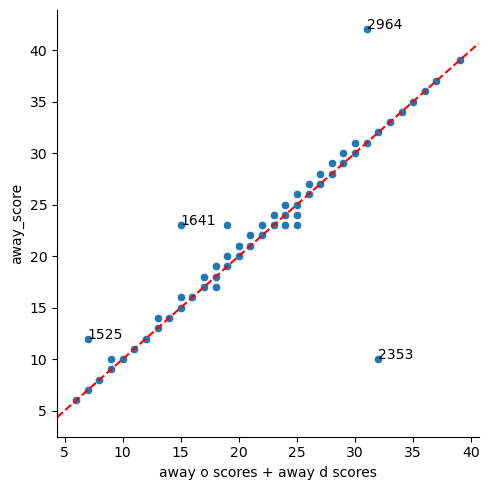

In [238]:
sns.relplot(x = (data.away_o_scores + data.away_d_scores), y=data.away_score)
xlim = plt.xlim()
plt.plot(xlim,xlim, 'r--')
plt.xlim(xlim)
plt.xlabel('away o scores + away d scores')
for ind in data[np.abs(data.away_score - (data.away_o_scores+data.away_d_scores))>4].index:
    plt.annotate(ind, 
        (data.loc[ind,'away_o_scores']+data.loc[ind,'away_d_scores'], data.loc[ind,'away_score'])
                )
plt.show()

In [228]:
data[np.abs(data.away_score - (data.away_o_scores+data.away_d_scores))>4][['away_score','away_o_scores','away_d_scores', 'game']]

,away_score,away_o_scores,away_d_scores,game
1641,23,12,3,2016-05-14-CHI-MIN
1525,12,7,0,2016-07-10-RAL-AUS
2353,10,8,24,2018-07-14-DET-PIT
2964,42,17,14,2022-11-12-allstar-game


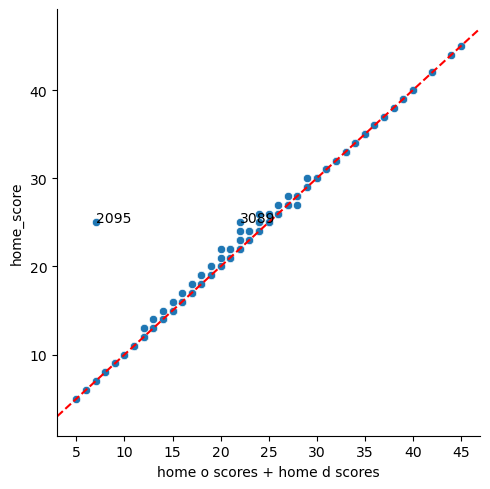

In [237]:
sns.relplot(x = (data.home_o_scores + data.home_d_scores), y=data.home_score)
xlim = plt.xlim()
plt.plot(xlim,xlim, 'r--')
plt.xlim(xlim)
plt.xlabel('home o scores + home d scores')
for ind in data[np.abs(data.home_score - (data.home_o_scores+data.home_d_scores))>2].index:
    plt.annotate(ind, 
        (data.loc[ind,'home_o_scores']+data.loc[ind,'home_d_scores'], data.loc[ind,'home_score'])
                )
plt.show()

In [233]:
data[np.abs(data.home_score - (data.home_o_scores+data.home_d_scores))>2][['home','home_score','home_o_scores','home_d_scores', 'game']]

,home,home_score,home_o_scores,home_d_scores,game
2095,AlleyCats,25,7,0,2014-05-10-MIN-IND
3089,Spiders,25,8,14,2023-07-08-POR-OAK


**Other Checks**

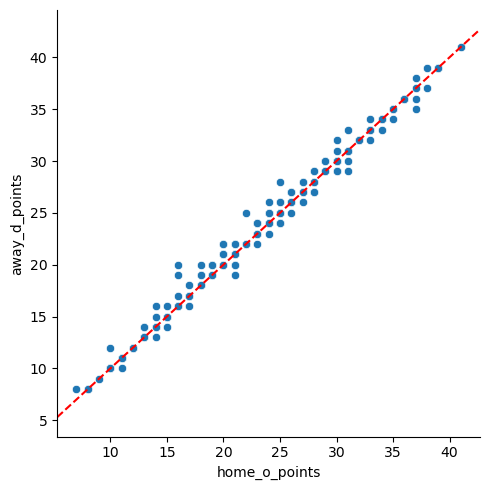

In [267]:
sns.relplot(x = data.home_o_points, y=data.away_d_points)
xlim = plt.xlim()
plt.plot(xlim,xlim, 'r--')
plt.xlim(xlim)
plt.show()

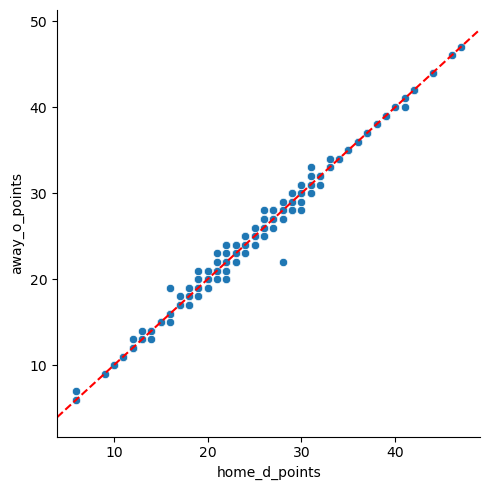

In [269]:
sns.relplot(x = data.home_d_points, y=data.away_o_points)
xlim = plt.xlim()
plt.plot(xlim,xlim, 'r--')
plt.xlim(xlim)
plt.show()

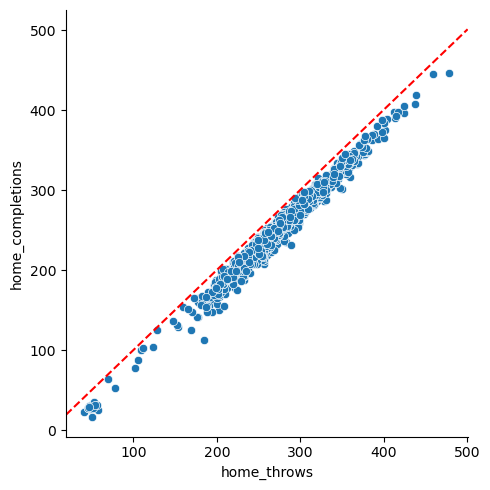

In [154]:
sns.relplot(x = data.home_throws, y=data.home_completions)
xlim = plt.xlim()
plt.plot(xlim,xlim, 'r--')
plt.xlim(xlim)
plt.show()

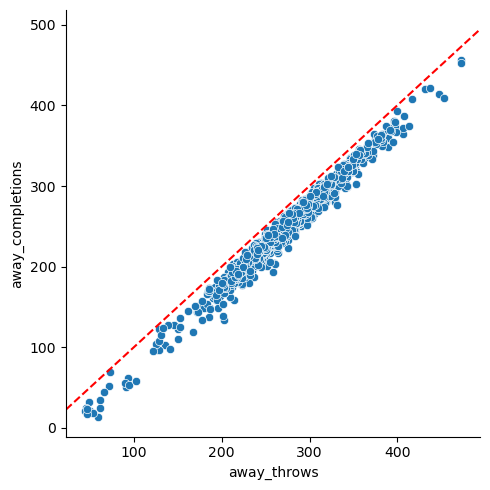

In [153]:
sns.relplot(x = data.away_throws, y=data.away_completions)
xlim = plt.xlim()
plt.plot(xlim,xlim, 'r--')
plt.xlim(xlim)
plt.show()

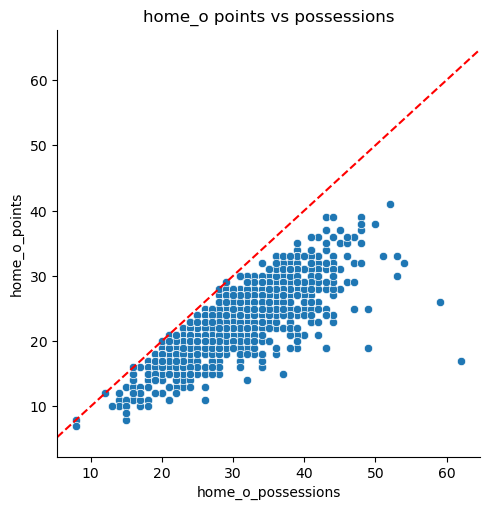

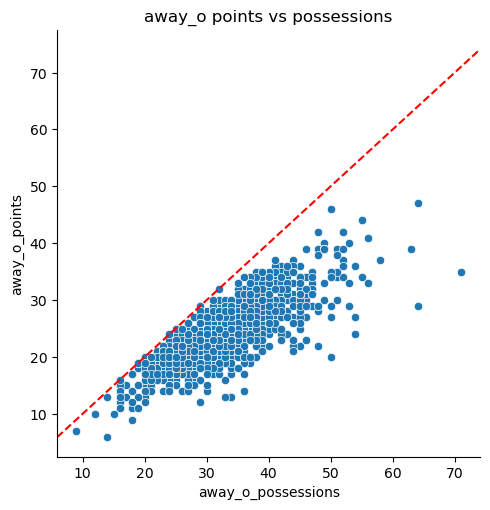

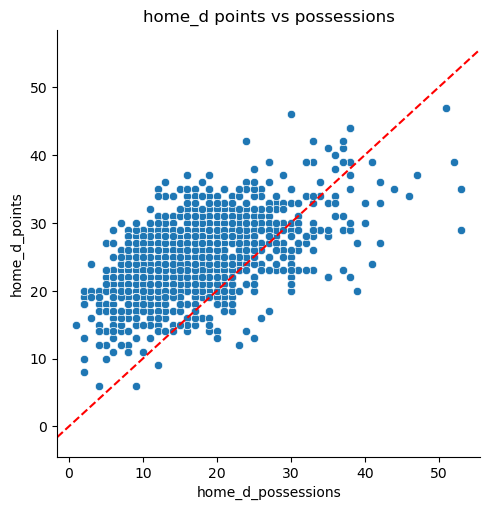

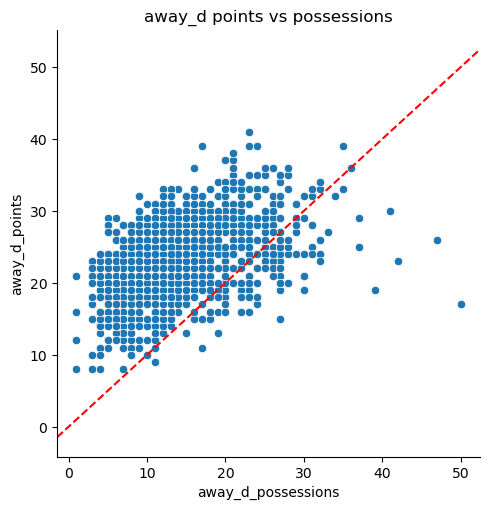

In [191]:
col1 = 'possessions' # points
col2 = 'points' # scores

for val2 in ['o','d']:
    for val1 in ['home','away']:
        sns.relplot(x = data[f"{val1}_{val2}_{col1}"], y=data[f"{val1}_{val2}_{col2}"])
        xlim = plt.xlim()
        plt.plot(xlim,xlim, 'r--')
        plt.xlim(xlim)
        plt.title(f"{val1}_{val2} {col2} vs {col1}")
        plt.show()

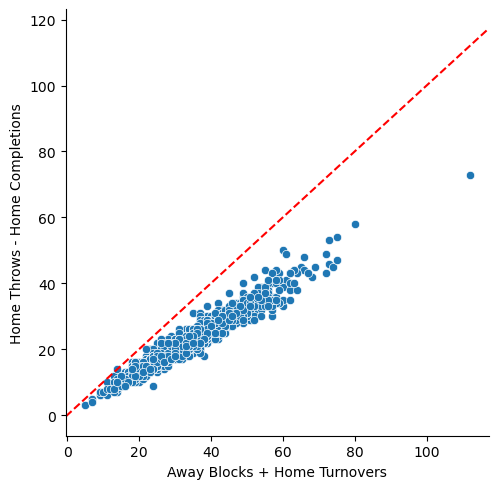

In [198]:
sns.relplot(x = data.away_blocks + data.home_turnovers, y=data.home_throws-data.home_completions )
xlim = plt.xlim()
plt.plot(xlim,xlim, 'r--')
plt.xlim(xlim)
plt.xlabel('Away Blocks + Home Turnovers')
plt.ylabel('Home Throws - Home Completions')
plt.show()

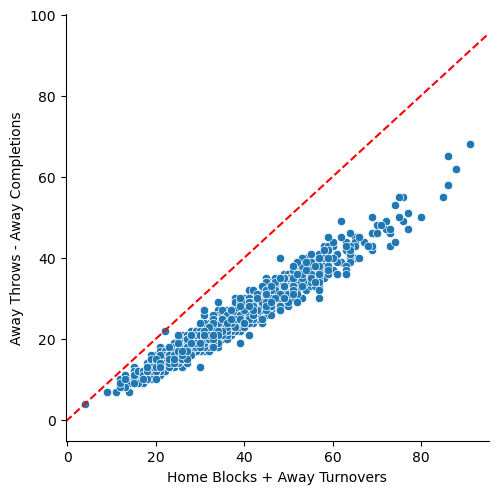

In [199]:
sns.relplot(x = data.home_blocks + data.away_turnovers, y=data.away_throws-data.away_completions)
xlim = plt.xlim()
plt.plot(xlim,xlim, 'r--')
plt.xlim(xlim)
plt.xlabel('Home Blocks + Away Turnovers')
plt.ylabel('Away Throws - Away Completions')
plt.show()

**Remove Bad Data**

In [175]:
bad_data_ind = data[np.abs(data.away_score - (data.away_o_scores+data.away_d_scores))>4].index.to_list()
bad_data_ind.extend(data[np.abs(data.home_score - (data.home_o_scores+data.home_d_scores))>3].index.to_list())
bad_data_ind

[1641, 1525, 2353, 2964, 2095]

In [176]:
print(data.shape)
data.drop(index=bad_data_ind,inplace=True)
print('removed games with bogus o_scores or d_scores data')
print(data.shape)

(1433, 27)
removed games with bogus o_scores or d_scores data
(1428, 27)


## Target Features
 - Plan for now:
   - considering each game from a particular team's (`OAK` or `DET`) perspective will invovle extra effort in separating home/away to avoid double-counting
   - will treat whole dataset as team agnostic for now, and create target features from the **home** team's perspective
     - this is how the statistics were recorded
 - Target Features for Model
   - **Home Margin**: `<home-score> - <away-score>`
     - final point differential, target for **regression** models
   - **Home Win**: `True` if `<home-score> > <away-score>`
     - final outcome, target for **logistic regression/classification** models
     - ties not considered wins for now

In [177]:
data.loc[:,'home_win'] = data.home_score > data.away_score
data.loc[:,'home_margin'] = data.home_score - data.away_score

#### `Home Win` Analysis
- basic symmetry checks
- is home field advantage a thing?

In [111]:
print(round(100*data.home_win.mean(),1), 'percent home victories')

58.0 percent home victories


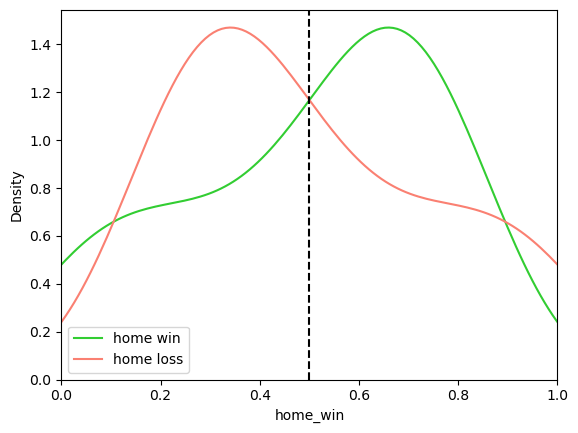

In [98]:
sns.kdeplot(x=data.groupby('home')['home_win'].mean(), label='home win', color='limegreen')
sns.kdeplot(x=1-data.groupby('home')['home_win'].mean(), label='home loss', color='salmon')
plt.axvline(x=0.5, ls='--', color='k')
plt.legend()
plt.xlim([0,1])
plt.show()

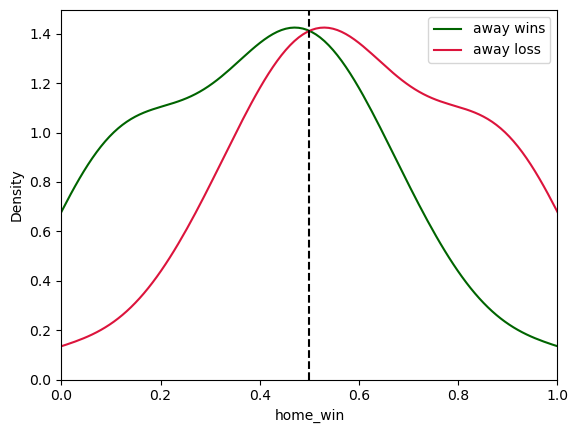

In [99]:
sns.kdeplot(x=1-data.groupby('away')['home_win'].mean(), label='away wins', color='darkgreen')
sns.kdeplot(x=data.groupby('away')['home_win'].mean(), label='away loss', color='crimson')
plt.axvline(x=0.5, ls='--', color='k')
plt.legend()
plt.xlim([0,1])
plt.show()

(0.0, 1.0)

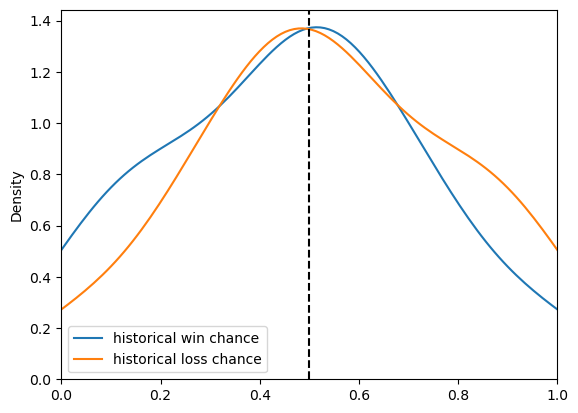

In [100]:
# historical team winning percentage
sns.kdeplot(x=np.array(teams.wins/teams.games), label='historical win chance')
sns.kdeplot(x=np.array(teams.losses/teams.games), label='historical loss chance')
plt.axvline(x=0.5, ls='--', color='k')
plt.legend()
plt.xlim([0,1])

#### `Home Margin` Analysis
- fun looking distribution, centered about 0 as one might expect
- but 0 is among the least common margins, due to the nature of the game
  - up to two overtime periods are played in an attempt to end with a victor
- correlation map shows that some features may simply have inverse relationships with home margin
  - may need to eliminate / combine some intercorrelated features later

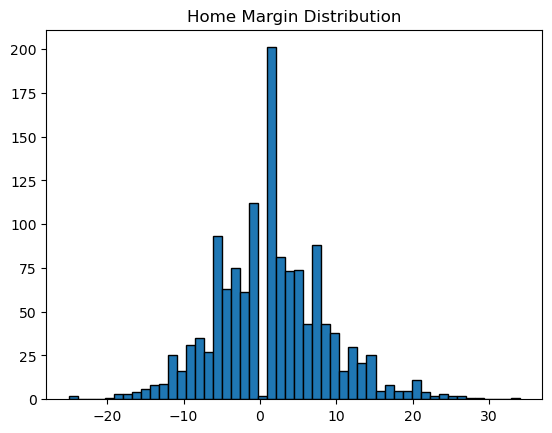

In [82]:
data['home_margin'].hist(edgecolor='k', bins=50)
plt.title('Home Margin Distribution')
plt.grid(False)
plt.show()

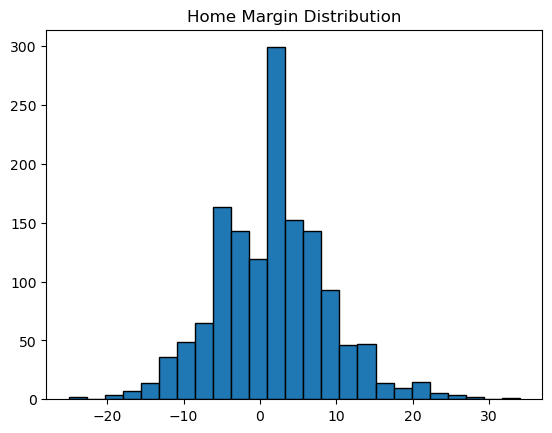

In [101]:
data['home_margin'].hist(edgecolor='k', bins=25)
plt.title('Home Margin Distribution')
plt.grid(False)
plt.show()

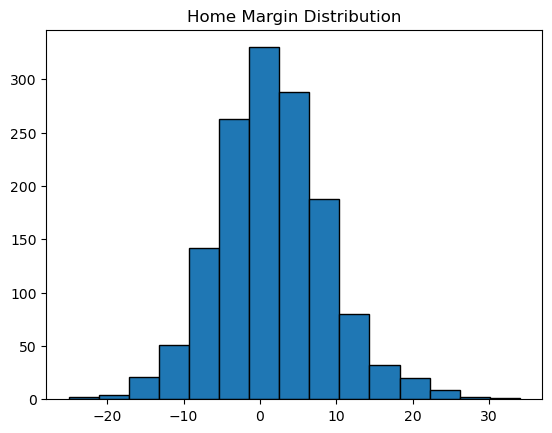

In [102]:
data['home_margin'].hist(edgecolor='k', bins=15)
plt.title('Home Margin Distribution')
plt.grid(False)
plt.show()

In [104]:
print('lowest home margins, Mechanix :(')
data.sort_values('home_margin').head()[['date','home_margin','home','home_score','away','away_score']]

lowest home margins, Mechanix :(


,date,home_margin,home,home_score,away,away_score
2068,2014-04-19 19:00:00+00:00,-25,Mechanix,9,Radicals,34
2674,2021-06-05 18:00:00+00:00,-24,Mechanix,10,Radicals,34
1885,2015-04-11 18:30:00+00:00,-20,Breeze,17,Rush,37
1483,2017-04-29 18:00:00+00:00,-19,Nightwatch,8,Legion,27
2964,2022-11-12 16:00:00+00:00,-18,SW All-Stars,24,EC All-Stars,42


In [105]:
print('highest home margins, Mechanix :(')
data.sort_values('home_margin', ascending=False).head()[['date','home_margin','home','home_score','away','away_score']]

highest home margins, Mechanix :(


,date,home_margin,home,home_score,away,away_score
1725,2015-07-17 19:00:00+00:00,34,Wind Chill,45,Mechanix,11
2258,2018-05-13 12:00:00+00:00,29,Radicals,37,Mechanix,8
2132,2014-06-07 19:00:00+00:00,28,Riptide,37,Lions,9
1739,2015-07-10 19:00:00+00:00,26,Thunderbirds,42,Mechanix,16
2157,2014-06-27 19:00:00+00:00,26,Wind Chill,42,Mechanix,16


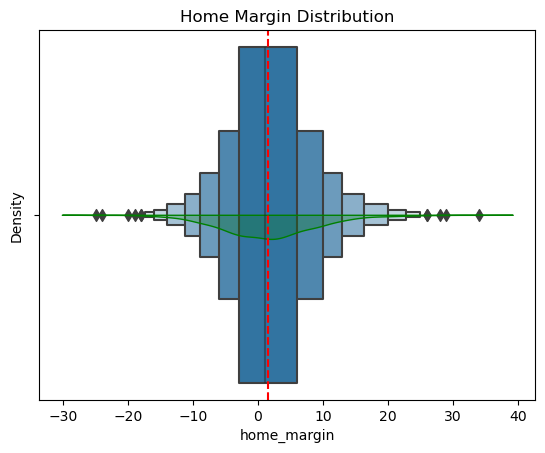

In [106]:
sns.boxenplot(x=data.home_margin)
sns.kdeplot(data.home_margin, color='g', fill=True)
plt.title('Home Margin Distribution')
plt.axvline(x=data.home_margin.mean(), c='r', linestyle='--')

In [118]:
# Correlation Table for target features
data.corr(numeric_only=True).iloc[-2:,2:-2].T.style\
        .background_gradient(cmap = 'PiYG', vmin=-1,vmax=1)\
        .format(formatter="{:.3f}")

,home_win,home_margin
away_completions,-0.034,-0.031
away_throws,0.022,0.052
away_blocks,-0.403,-0.436
away_turnovers,0.359,0.523
away_o_scores,-0.057,-0.139
away_o_points,0.546,0.702
away_o_possessions,0.516,0.694
away_d_scores,-0.679,-0.812
away_d_points,-0.517,-0.671
away_d_possessions,-0.585,-0.690


<Axes: >

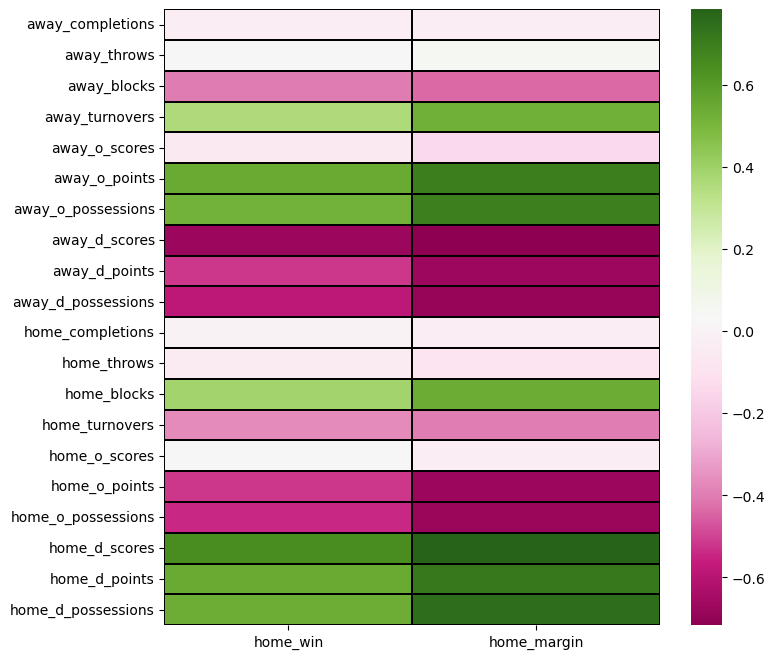

In [119]:
plt.figure(figsize=(8,8))
sns.heatmap(data.corr(numeric_only=True).iloc[-2:,2:-2].T, cmap = 'PiYG',
           linecolor='k', linewidths=0.2, robust=True)

## Initial Exploration
 - Final Cleaning - bogus data checks, removal
 - Feature distributions
   - polynomial regression fit for **Home Margin**
   - logistic regression fit for **Home Win**
   - feature vs feature Pearson correlation heat maps
   - feature vs feature *pair-plots*
     - joint-plots

#### Basic Histograms,Regressions

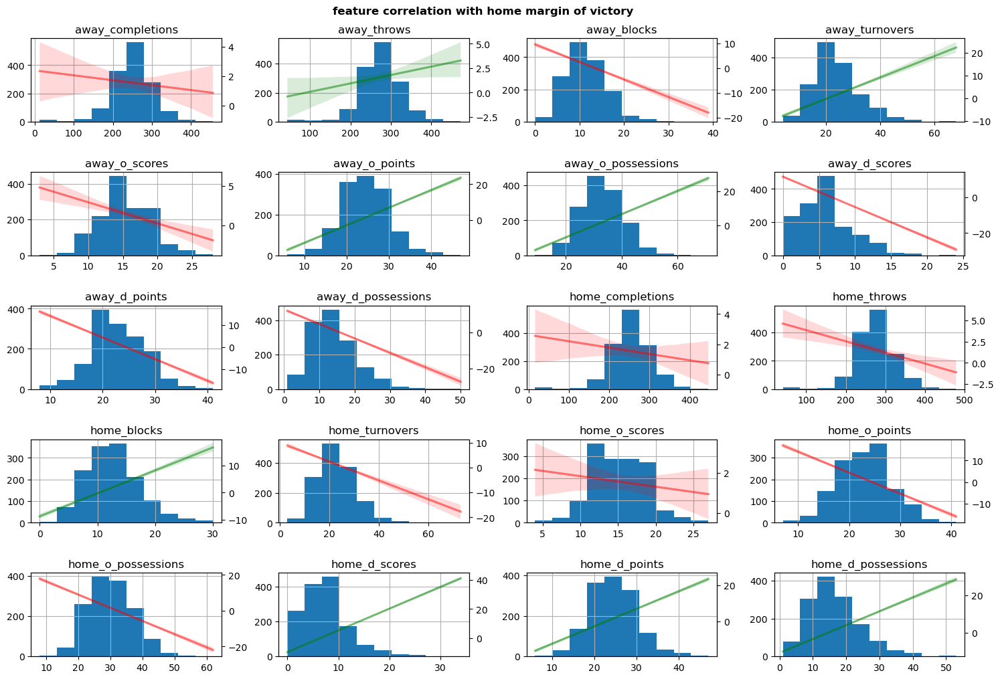

CPU times: total: 35.7 s
Wall time: 13.4 s


In [243]:
%%time

# all numerical feature except score
# distributions, reg fit vs home margin
x = data.iloc[:,7:27].hist(figsize=(18,12))
plt.subplots_adjust(hspace=0.6)
for row in x:
    for graph in row:
        param = graph.title.get_text()
        if param:
            # indicate positive / negative relationship with green / red
            c = 'g' if data[[param,'home_margin']].corr().iloc[0,1] > 0 else 'r' 
            sns.regplot(data, x=param, y='home_margin', scatter=False,
                   ax = graph.twinx(), color=c, line_kws=dict(alpha=0.5))
            plt.ylabel('')
plt.suptitle('feature correlation with home margin of victory', y=0.92, fontweight='bold')
plt.savefig(Path('graphs/EDA/basic_features_hist_vs_margin.png'), dpi=300, bbox_inches='tight')
plt.show()

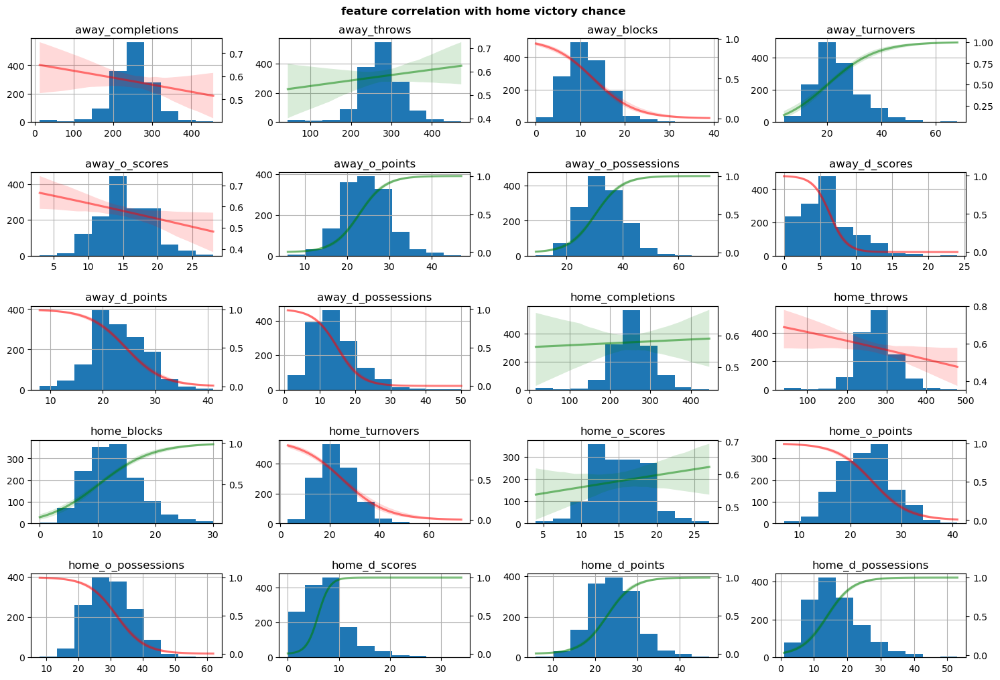

CPU times: total: 2min 17s
Wall time: 30.3 s


In [244]:
%%time
# all numerical feature except score
# distributions, reg fit vs home margin
# can adjust n_boot (default 1000) to decrease plotting time
# ex: try 250 for speed up
x = data.iloc[:,7:27].hist(figsize=(18,12))
plt.subplots_adjust(hspace=0.6)
for row in x:
    for graph in row:
        param = graph.title.get_text()
        if param:
            # indicate positive / negative relationship with green / red
            c = 'g' if data[[param,'home_win']].corr().iloc[0,1] > 0 else 'r' 
            sns.regplot(data, x=param, y='home_win', scatter=False, logistic=True,
                   ax = graph.twinx(), color=c, line_kws=dict(alpha=0.5), n_boot=250)
            plt.ylabel('')
plt.suptitle('feature correlation with home victory chance', y=0.92, fontweight='bold')
plt.savefig(Path('graphs/EDA/basic_features_hist_vs_win.png'), dpi=300, bbox_inches='tight')
plt.show()

#### Basic Correlation Heatmap

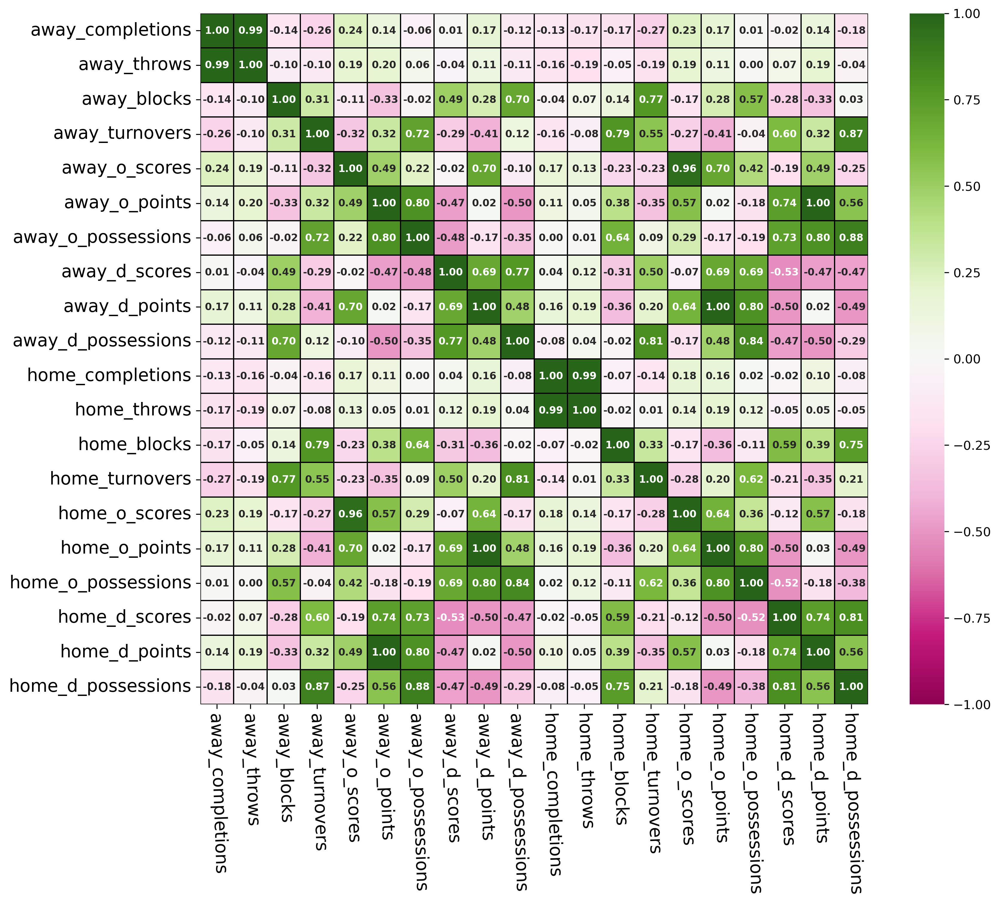

CPU times: total: 3.72 s
Wall time: 3.72 s


In [242]:
%%time

# basic feature correlation heat map
fig = plt.figure(figsize=(12,10), dpi=300)
sns.heatmap(data.iloc[:,7:27].corr(), cmap='PiYG', linecolor='k', linewidths=0.5,
           vmin=-1, vmax=1,yticklabels=True, xticklabels=True, fmt=".2f",
           annot=True, annot_kws=dict(fontsize=8,fontweight='bold'))
plt.tick_params(axis='x',labelrotation=-88)
plt.tick_params(axis='both',labelsize=14)
plt.savefig(Path('graphs/EDA/basic_features_corr_heatmap.png'), dpi=300, bbox_inches='tight')
plt.show()

 - Quick Notes
   - notice strong positive correlation between `home_o_scores` and `away_d_points`. with the exception of quarter ends, the latter event directly follows the former. therefore both features should not be kept for final model training.
     - however, `away_d_points` will be used in engineered features, such as `away_d_conversion`
     - with what frequency did the away team score when they were on defense
   - similar case for `home_d_possessions` vs `away_blocks`
   - these are the things to look for in preprocessing!

#### Basic Pairplots

In [301]:
data.columns[5:27]

Index(['home_score', 'away_score', 'away_completions', 'away_throws',
       'away_blocks', 'away_turnovers', 'away_o_scores', 'away_o_points',
       'away_o_possessions', 'away_d_scores', 'away_d_points',
       'away_d_possessions', 'home_completions', 'home_throws', 'home_blocks',
       'home_turnovers', 'home_o_scores', 'home_o_points',
       'home_o_possessions', 'home_d_scores', 'home_d_points',
       'home_d_possessions'],
      dtype='object')

<Figure size 3600x3000 with 0 Axes>

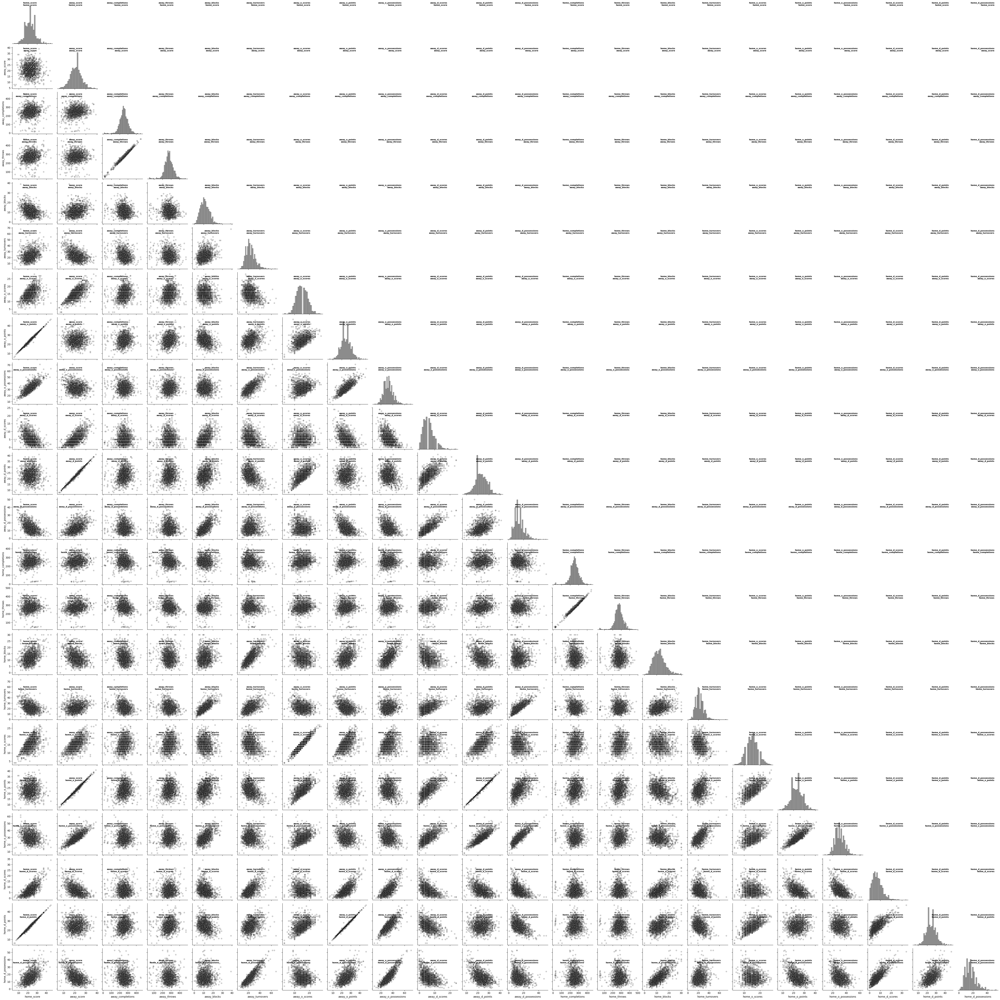

CPU times: total: 2min 36s
Wall time: 2min 36s


In [302]:
%%time
# basic feature pair plots, 20s to do columns 9:15
# columns 9:37, corner=True, figsize(12,10), dpi=300, takes > 8 mins 

# adjust column range as needed
i1=5 
i2=27

# info for labels
cols = data.columns[i1:i2]
ylabels = list(cols)
ylabels.reverse()

# pairplot
fig = plt.figure(figsize=(12,10), dpi=300)
sns.pairplot(data.iloc[:,i1:i2], corner=True,
             plot_kws=dict(color='k', alpha=0.2),
             diag_kws=dict(color='grey'))

# positions for labels
xl = np.linspace(1/len(cols), .985, len(cols))
yl = np.linspace(1/(len(cols)), .985, len(cols))

# add labels
for x,x_lab in zip(xl,cols):
    for y,y_lab in zip(yl, ylabels):
        plt.gcf().text(x,y,f'{x_lab}\n{y_lab}', fontweight='bold', ha='right',
                      fontsize=8,)

plt.savefig(Path('graphs/EDA/pairplots/basic_features_PAIRPLOT.png'), dpi=300, bbox_inches='tight')
plt.show()

 - take notes based on pair plot
 - select a few features to evaluate with joint plots

#### Preliminary Investigations for Derived Features
 - Inverse Relationships for Home/Away -- Hold/Break rates
   - worth keeping both for now, as games are not perfectly symmetrical
 - offensive possessions per score or per point?
   - per hold shows greater correlation with target, intercorrelation with basic features not investigated
   - similar distributions (approx normal with tail), per hold over greater range
 - defensive possesions per point had stronger relationship to targets, more normal distribution

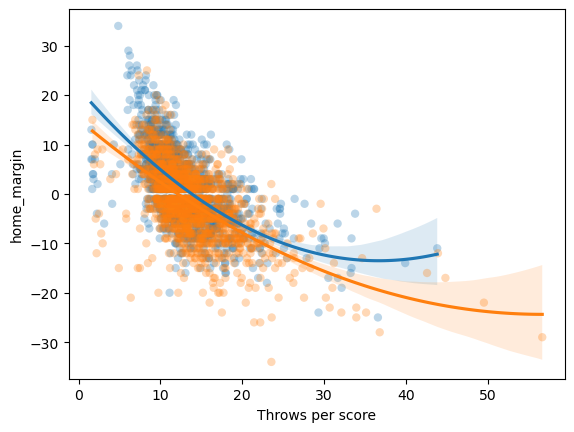

In [86]:
sns.regplot(x=data.home_throws/data.home_score, y = data.home_margin, order=2, scatter_kws=dict(edgecolor='none', alpha=0.3))
sns.regplot(x=data.away_throws/data.away_score, y = -1*data.home_margin, order=2, scatter_kws=dict(edgecolor='none', alpha=0.3),)
plt.xlabel('Throws per score')
plt.show()

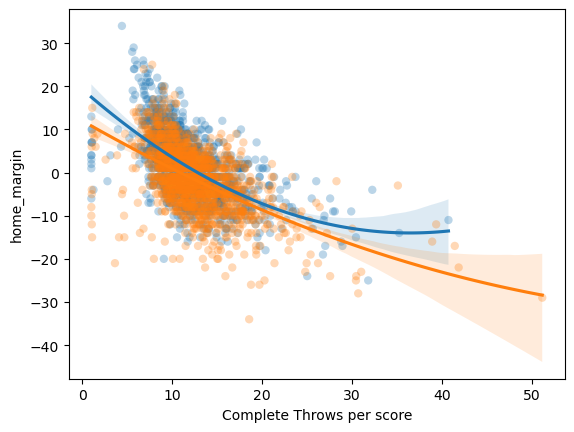

In [107]:
sns.regplot(x=data.home_completions/data.home_score, y = data.home_margin, order=2, scatter_kws=dict(edgecolor='none', alpha=0.3))
sns.regplot(x=data.away_completions/data.away_score, y = -1*data.home_margin, order=2, scatter_kws=dict(edgecolor='none', alpha=0.3),)
plt.xlabel('Complete Throws per score')
plt.show()

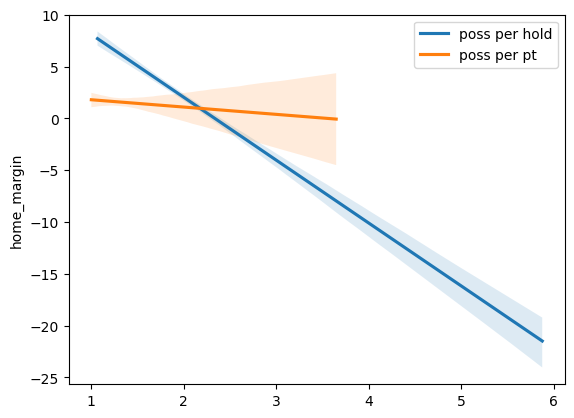

In [255]:
sns.regplot(x = data.home_o_possessions/data.home_o_scores, y = data.home_margin, scatter=False, label='poss per hold')
sns.regplot(x = data.home_o_possessions/data.home_o_points, y = data.home_margin, scatter=False, label='poss per pt')
plt.legend()
plt.show()

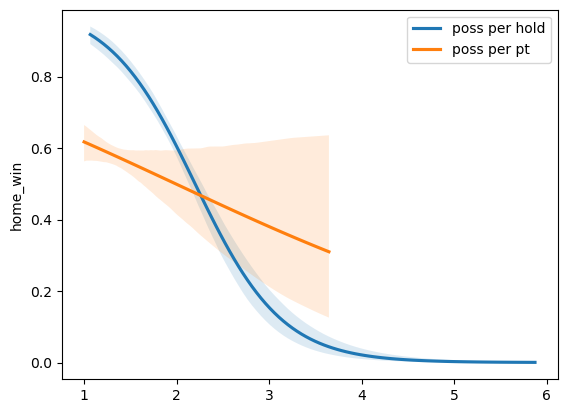

CPU times: total: 48.4 s
Wall time: 8.1 s


In [257]:
%%time
sns.regplot(x = data.home_o_possessions/data.home_o_scores, y = data.home_win, scatter=False, label='poss per hold', logistic=True)
sns.regplot(x = data.home_o_possessions/data.home_o_points, y = data.home_win, scatter=False, label='poss per pt', logistic=True)
plt.legend()
plt.show()

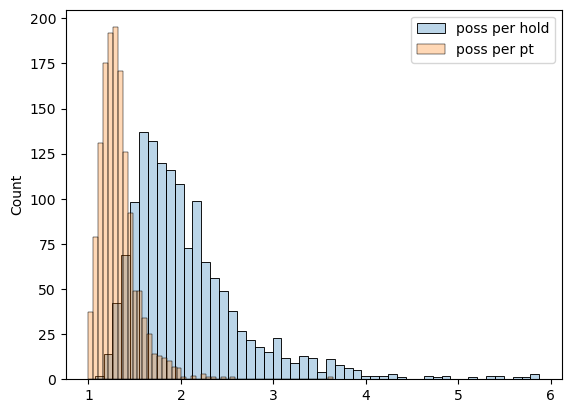

In [254]:
sns.histplot(data.home_o_possessions/data.home_o_scores, alpha=0.3, label='poss per hold', bins=50)
sns.histplot(data.home_o_possessions/data.home_o_points, alpha=0.3, label='poss per pt', bins=50)
plt.legend()
plt.show()

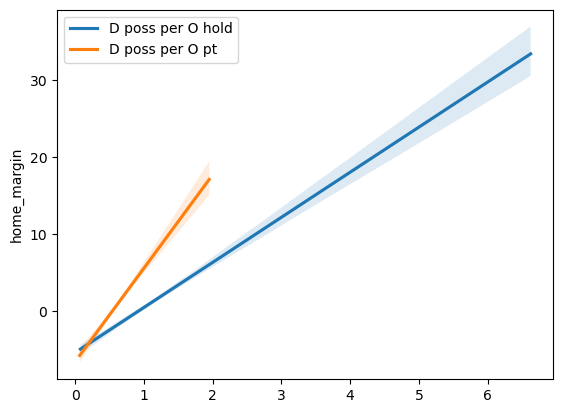

In [266]:
sns.regplot(x = data.home_d_possessions/data.home_o_scores, y = data.home_margin, scatter=False, label='D poss per O hold')
sns.regplot(x = data.home_d_possessions/data.home_d_points, y = data.home_margin, scatter=False, label='D poss per O pt')
plt.legend()
plt.show()

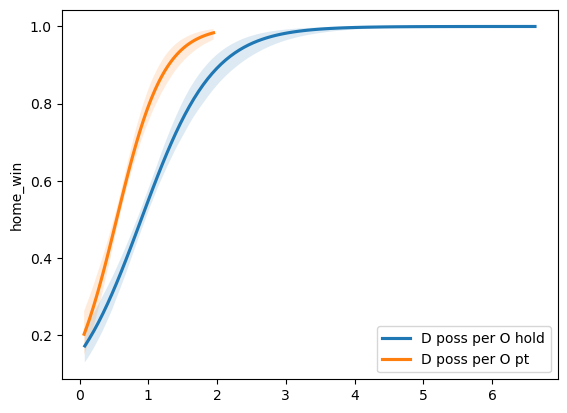

CPU times: total: 48.2 s
Wall time: 8.1 s


In [265]:
%%time
sns.regplot(x = data.home_d_possessions/data.home_o_scores, y = data.home_win, scatter=False, label='D poss per O hold', logistic=True)
sns.regplot(x = data.home_d_possessions/data.home_d_points, y = data.home_win, scatter=False, label='D poss per O pt', logistic=True)
plt.legend()
plt.show()

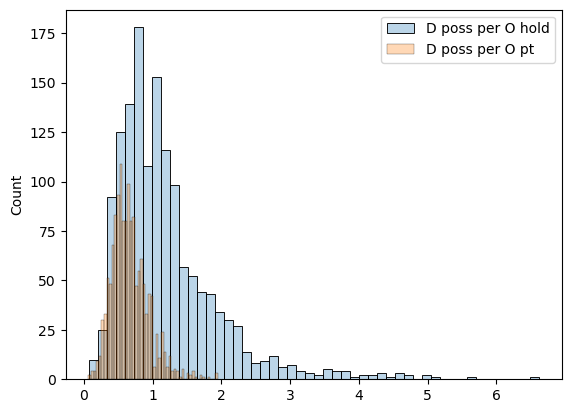

In [264]:
sns.histplot(data.home_d_possessions/data.home_o_scores, alpha=0.3, label='D poss per O hold', bins=50)
sns.histplot(data.home_d_possessions/data.home_d_points, alpha=0.3, label='D poss per O pt', bins=50)
plt.legend()
plt.show()

## Derived Features
 - Combine obvious features for now, more intricate combinations/deletions later?
   - ex: throws completed / throws attempted = throw %
 - Repeat exercises above
 - should expect more intercorrelation, based on "Home/Away" definitions

In [179]:
ddata = pd.DataFrame(index=data.index)
ddata['home_margin'] = data.home_margin
ddata['home_win'] = data.home_win

In [106]:
data.iloc[:,7:].columns

Index(['away_completions', 'away_throws', 'away_blocks', 'away_turnovers',
       'away_o_scores', 'away_o_points', 'away_o_possessions', 'away_d_scores',
       'away_d_points', 'away_d_possessions', 'home_completions',
       'home_throws', 'home_blocks', 'home_turnovers', 'home_o_scores',
       'home_o_points', 'home_o_possessions', 'home_d_scores', 'home_d_points',
       'home_d_possessions', 'home_win', 'home_margin'],
      dtype='object')

In [180]:
# deleted huck % (completions/throws) and redzone efficiency (scores/possessions) stats

### Overall, some skewed to O/D
# comp %
ddata['home_completion_rate'] = data.home_completions / data.home_throws
ddata['away_completion_rate'] = data.away_completions / data.away_throws
# block %
ddata['home_block_rate'] = data.home_blocks / data.away_throws
ddata['away_block_rate'] = data.away_blocks / data.home_throws
# throws per score
ddata['away_throw_per_score'] = data.away_throws / data.away_score
ddata['home_throw_per_score'] = data.home_throws / data.home_score


### OFFENSE

# hold %
ddata['home_hold_rate'] = data.home_o_scores / data.home_o_points
ddata['away_hold_rate'] = data.away_o_scores / data.away_o_points

# O Line possessions per hold
ddata['home_o_poss_per_hold'] = data.home_o_possessions / data.home_o_scores
ddata['away_o_poss_per_hold'] = data.away_o_possessions / data.away_o_scores

### DEFENSE
# break %, games not perfectly symmetrical so calculate in addition to hold %
ddata['home_break_rate'] = data.home_d_scores / data.home_d_points
ddata['away_break_rate'] = data.away_d_scores / data.away_d_points

# D Line possessions per point
ddata['home_d_poss_per_pt'] = data.home_d_possessions / data.home_d_points
ddata['away_d_poss_per_pt'] = data.away_d_possessions / data.away_d_points

# D Line breaks per possession
ddata['home_break_per_poss'] = data.home_d_scores / data.home_d_possessions
ddata['away_break_per_poss'] = data.away_d_scores / data.away_d_possessions

#### Derived Correlations, Distributions

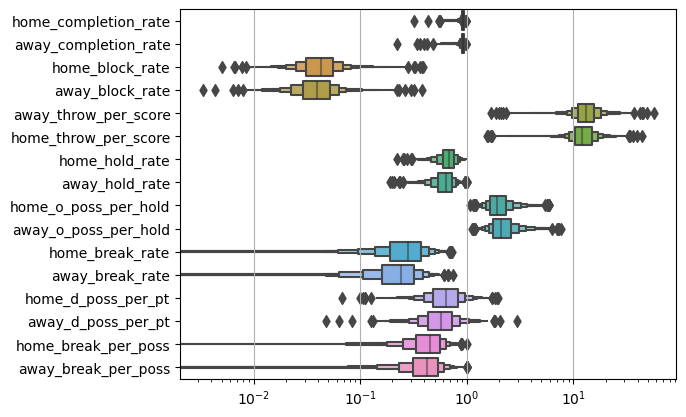

In [118]:
sns.boxenplot(ddata.iloc[:,2:], orient='h')
plt.xscale('log')
ylim = plt.ylim()
plt.grid(axis='x')
plt.show()

In [283]:
ddata.iloc[:,2:].describe()

,home_completion_rate,away_completion_rate,home_block_rate,away_block_rate,home_hold_rate,away_hold_rate,home_o_poss_per_hold,away_o_poss_per_hold,home_break_rate,away_break_rate,home_d_poss_per_pt,away_d_poss_per_pt,home_break_per_poss,away_break_per_poss
count,1428.000000,1428.000000,1428.000000,1428.000000,1428.000000,1428.000000,1428.000000,1428.000000,1428.000000,1428.000000,1428.000000,1428.000000,1428.000000,1428.000000
mean,0.914026,0.906165,0.047909,0.043364,0.672251,0.627396,2.076565,2.297301,0.287358,0.246849,0.670160,0.606842,0.444116,0.421342
std,0.048987,0.058641,0.031034,0.026283,0.129755,0.138170,0.655733,0.831441,0.132299,0.121710,0.266850,0.259825,0.168115,0.174076
min,0.320000,0.220339,0.000000,0.000000,0.222222,0.191489,1.066667,1.117647,0.000000,0.000000,0.066667,0.047619,0.000000,0.000000
25%,0.900277,0.893194,0.031008,0.028942,0.590909,0.538462,1.642857,1.750000,0.190476,0.160968,0.482759,0.428571,0.333333,0.312500
50%,0.922479,0.915807,0.042918,0.039117,0.679286,0.633333,1.923077,2.083333,0.280000,0.240000,0.636364,0.571429,0.454545,0.421053
75%,0.939716,0.936170,0.055781,0.052245,0.761905,0.722222,2.312500,2.583333,0.375000,0.320357,0.820742,0.727273,0.555556,0.538462
max,0.986395,0.982500,0.389831,0.380000,1.000000,1.000000,5.875000,7.666667,0.723404,0.741935,1.950000,2.941176,1.000000,1.000000


In [119]:
# Correlation Table for target features
ddata.corr(numeric_only=True).iloc[:2,2:].T.style\
        .background_gradient(cmap = 'PiYG', vmin=-1,vmax=1)\
        .format(formatter="{:.3f}")

,home_margin,home_win
home_completion_rate,0.193,0.184
away_completion_rate,-0.291,-0.196
home_block_rate,0.315,0.231
away_block_rate,-0.246,-0.232
away_throw_per_score,0.592,0.401
home_throw_per_score,-0.604,-0.475
home_hold_rate,0.750,0.619
away_hold_rate,-0.805,-0.616
home_o_poss_per_hold,-0.538,-0.448
away_o_poss_per_hold,0.621,0.392


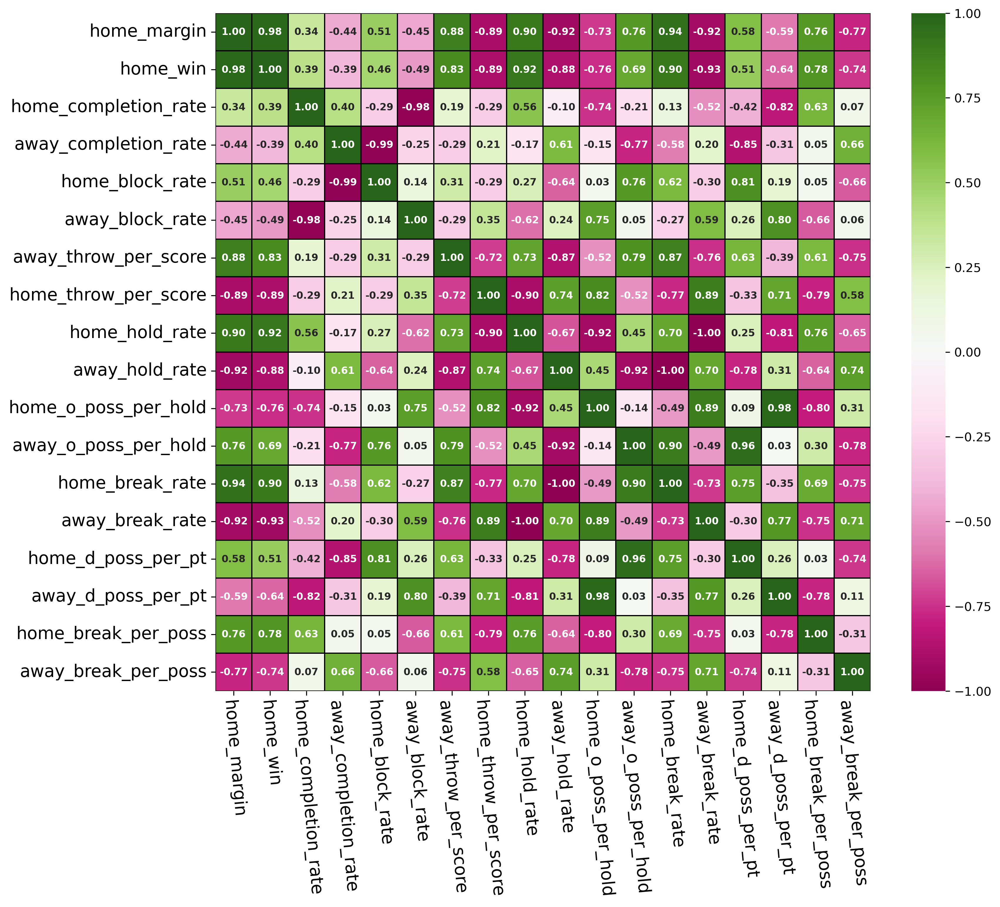

In [120]:
# basic feature correlation heat map
fig = plt.figure(figsize=(12,10), dpi=300)
sns.heatmap(ddata.corr(numeric_only=True).corr(), cmap='PiYG', linecolor='k', linewidths=0.5,
           vmin=-1, vmax=1,yticklabels=True, xticklabels=True,  fmt=".2f",
           annot=True, annot_kws=dict(fontsize=8,fontweight='bold'))
plt.tick_params(axis='x',labelrotation=-85)
plt.tick_params(axis='both',labelsize=14)
plt.savefig(Path('graphs/EDA/derived_features_corr_heatmap.png'), dpi=300, bbox_inches='tight')
plt.show()

#### Derived Data Histograms,Regressions

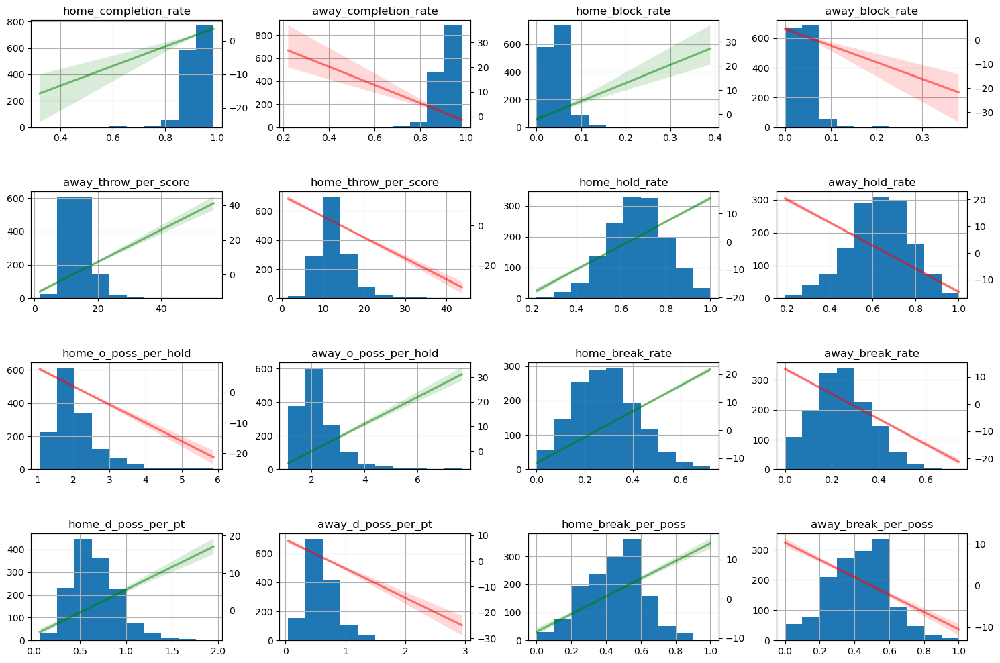

In [121]:
# all numerical feature except score
# distributions, reg fit vs home margin
x = ddata.iloc[:,2:].hist(figsize=(18,12))
plt.subplots_adjust(hspace=0.6)
for row in x:
    for graph in row:
        param = graph.title.get_text()
        if param:
            # indicate positive / negative relationship with green / red
            c = 'g' if ddata[[param,'home_margin']].corr().iloc[0,1] > 0 else 'r' 
            sns.regplot(ddata, x=param, y='home_margin', scatter=False,
                   ax = graph.twinx(), color=c, line_kws=dict(alpha=0.5))
            plt.ylabel('')

plt.savefig(Path('graphs/EDA/derived_features_hist_vs_margin.png'), dpi=300, bbox_inches='tight')
plt.show()

*should I try any simple transformations of the features to better assess distributions?*

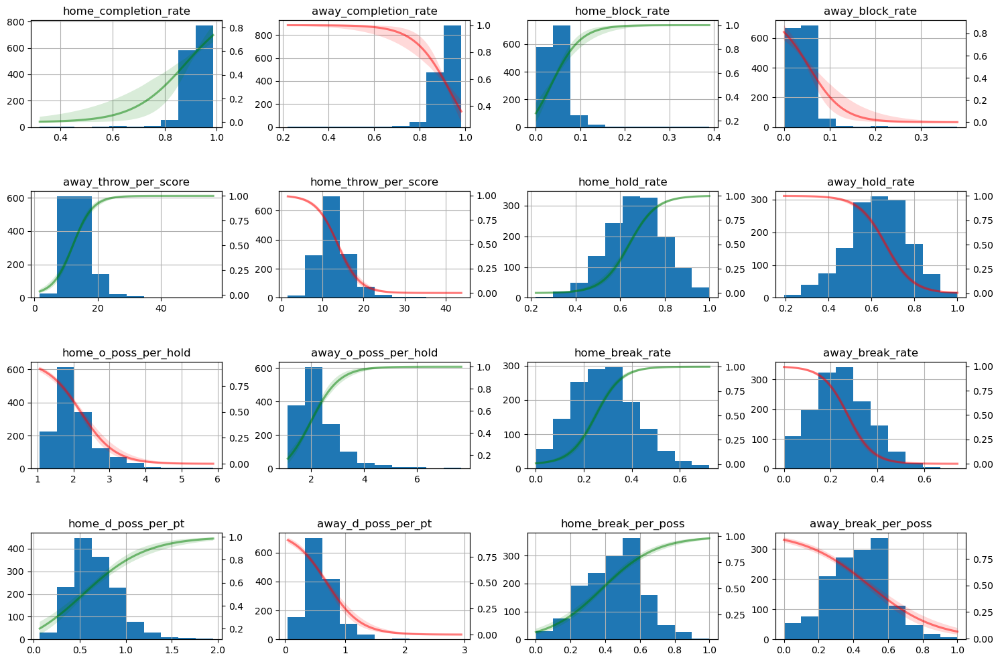

CPU times: total: 2min
Wall time: 26.7 s


In [122]:
%%time
# all numerical feature except score
# distributions, reg fit vs home margin
# can adjust n_boot (default 1000) to decrease plotting time
# ex: try 250 for speed up
x = ddata.iloc[:,2:].hist(figsize=(18,12))
plt.subplots_adjust(hspace=0.6)
for row in x:
    for graph in row:
        param = graph.title.get_text()
        if param:
            # indicate positive / negative relationship with green / red
            c = 'g' if ddata[[param,'home_win']].corr().iloc[0,1] > 0 else 'r' 
            sns.regplot(ddata, x=param, y='home_win', scatter=False, logistic=True,
                   ax = graph.twinx(), color=c, line_kws=dict(alpha=0.5), n_boot=250)
            plt.ylabel('')

plt.savefig(Path('graphs/EDA/derived_features_hist_vs_win.png'), dpi=300, bbox_inches='tight')
plt.show()

#### Derived Pairplots

In [124]:
ddata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1434 entries, 2057 to 3232
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   home_margin           1434 non-null   int32  
 1   home_win              1434 non-null   bool   
 2   home_completion_rate  1428 non-null   float64
 3   away_completion_rate  1428 non-null   float64
 4   home_block_rate       1428 non-null   float64
 5   away_block_rate       1428 non-null   float64
 6   away_throw_per_score  1428 non-null   float64
 7   home_throw_per_score  1428 non-null   float64
 8   home_hold_rate        1433 non-null   float64
 9   away_hold_rate        1429 non-null   float64
 10  home_o_poss_per_hold  1433 non-null   float64
 11  away_o_poss_per_hold  1429 non-null   float64
 12  home_break_rate       1433 non-null   float64
 13  away_break_rate       1429 non-null   float64
 14  home_d_poss_per_pt    1433 non-null   float64
 15  away_d_poss_per_pt

<Figure size 3600x3000 with 0 Axes>

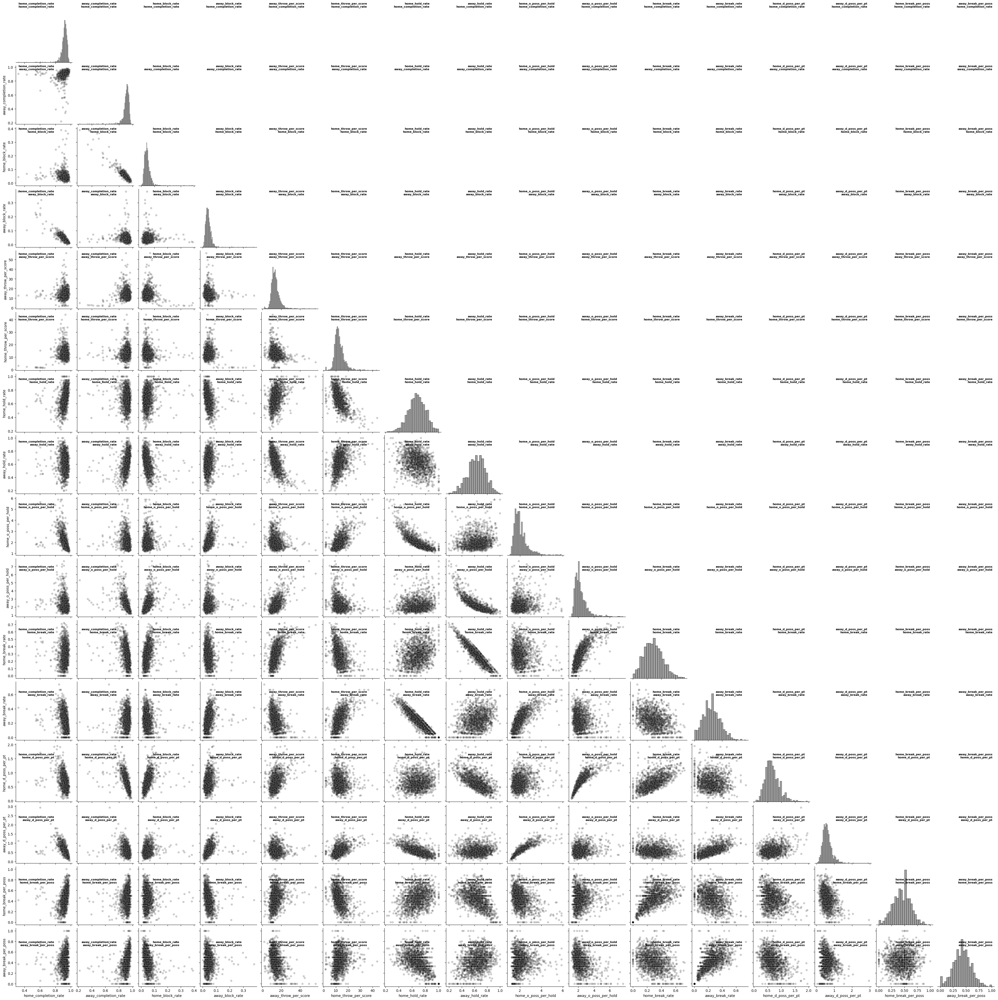

CPU times: total: 1min 27s
Wall time: 1min 27s


In [127]:
%%time
# basic feature pair plots, 20s to do columns 9:15
# columns 9:37, corner=True, figsize(12,10), dpi=300, takes > 8 mins 

# adjust column range as needed
i1=2 
i2=18

# info for labels
cols = ddata.columns[i1:i2]
ylabels = list(cols)
ylabels.reverse()

# pairplot
fig = plt.figure(figsize=(12,10), dpi=300)
sns.pairplot(ddata.iloc[:,i1:i2], corner=True,
             plot_kws=dict(color='k', alpha=0.2),
             diag_kws=dict(color='grey'))

# positions for labels
xl = np.linspace(1/len(cols), .985, len(cols))
yl = np.linspace(1/(len(cols)), .985, len(cols))

# add labels
for x,x_lab in zip(xl,cols):
    for y,y_lab in zip(yl, ylabels):
        plt.gcf().text(x,y,f'{x_lab}\n{y_lab}', fontweight='bold', ha='right',
                      fontsize=8,)

plt.savefig(Path('graphs/EDA/pairplots/derived_features_PAIRPLOT.png'), dpi=300, bbox_inches='tight')
plt.show()

#### Pillow Interlude
*edit graph images*

In [130]:
# remove upper right "data" from pair plot images to save some space
# (W/F,0) to (W,H-H/F) to (W,0)
from PIL import Image, ImageDraw
Image.MAX_IMAGE_PIXELS=None
# black/white fill does not save space
# how to do transparent?
# 10s for small graph, 30s for big graph

In [128]:
ddata.columns[2:18].shape[0]

16

In [305]:
data.columns[5:27].shape[0]

22

In [131]:
%%time

images = {
    Path('graphs/EDA/pairplots/derived_features_PAIRPLOT.png') : 16,
    # Path('graphs/EDA/pairplots/basic_features_PAIRPLOT.png') : 22,
}

for plot in images.keys():
    with Image.open(plot) as im:
        features = images[plot]
        fill = ImageDraw.Draw(im)
        fill.polygon(
            [(im.width/features, 0), 
            (im.width, im.height - im.height/features),
            (im.width, 0)],
            fill = 'black',
        )
        im.save(Path(f'graphs/EDA/pairplots/chop_{plot.name}'))
    

CPU times: total: 11.4 s
Wall time: 11.4 s


In [117]:
del Image,ImageDraw,px

### Derived Feature Outlier Analysis
- x hold rate + y break rate ~ 1 `2062`
  - all points result in one team holding or the other team breaking, end of period will result in some numbers away from one
    - accounts for result being less than 1, but what about over 1?
    - see graph
  - high/low game was outlier for margin of victory, investigate scores per throw distribution . . .
- scores per throw << 1
  - two home games with values > 0.6, same home team + matchup: `1815`,`1724`
    - seem to only be counting scoring attempts? total throws don't add up
    - maybe throws and/or completions only counted on offense
  - two away games with values > 0.5: `2062`, `1850`
    - similar to above
  - Riptide offending outlier team 3/4 cases, twice at home and once away

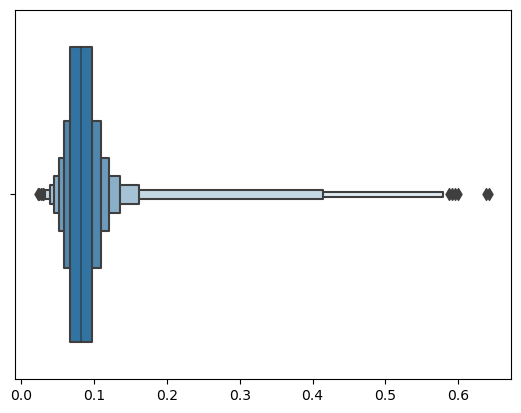

In [75]:
sns.boxenplot(x=data.home_score/data.home_throws)
plt.show()

In [84]:
data[data.home_score/data.home_throws > 0.6][['game','home','away','home_score','home_completions','home_throws','home_turnovers','away_blocks',
                                             'home_o_scores','home_d_scores']]

,game,home,away,home_score,home_completions,home_throws,home_turnovers,away_blocks,home_o_scores,home_d_scores
1815,2015-05-23-VAN-SEA,Cascades,Riptide,34,35,53,18,6,24,10
1724,2015-07-18-VAN-SEA,Cascades,Riptide,30,30,47,17,7,15,15


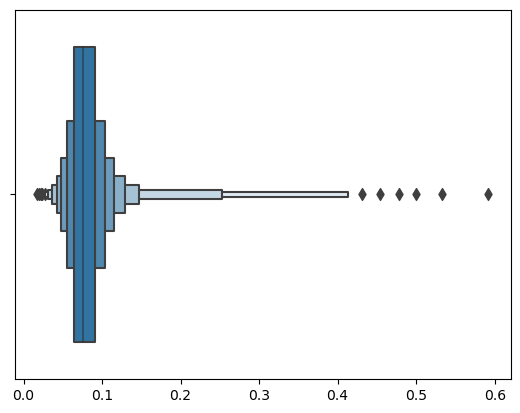

In [71]:
sns.boxenplot(x=data.away_score/data.away_throws)
plt.show()

In [80]:
data[data.away_score/data.away_throws > 0.5][['game','home','away','away_score','away_completions','away_throws','away_turnovers','home_blocks']]

,game,home,away,away_score,away_completions,away_throws,away_turnovers,home_blocks
2062,2014-04-12-VAN-SLC,Lions,Riptide,29,32,49,17,13
1850,2015-05-02-OTT-ROC,Dragons,Outlaws,24,25,45,20,10


In [64]:
cutoff = 1.1
data[(data.home_hold_rate+data.away_break_rate > cutoff) | (data.away_hold_rate+data.home_break_rate > cutoff)].T

,2062
game,2014-04-12-VAN-SLC
date,2014-04-12 19:00:00+00:00
week,1
home,Lions
away,Riptide
home_score,14
away_score,29
away_completions,32
away_throws,49
away_blocks,18


In [63]:
cutoff = 0.5
data[(data.home_hold_rate+data.away_break_rate < cutoff) | (data.away_hold_rate+data.home_break_rate < cutoff)]

,game,date,week,home,away,home_score,away_score,away_completions,away_throws,away_blocks,...,home_hold_rate,away_hold_rate,home_o_poss_per_hold,away_o_poss_per_hold,home_break_rate,away_break_rate,home_d_poss_per_pt,away_d_poss_per_pt,home_break_per_poss,away_break_per_poss
2062,2014-04-12-VAN-SLC,2014-04-12 19:00:00+00:00,1,Lions,Riptide,14,29,32,49,18,...,0.433333,0.375,3.384615,3.5,0.0625,0.741935,0.5625,0.935484,0.111111,0.793103


In [62]:
pd.DataFrame(data.mean(numeric_only=True)).T

,home_score,away_score,away_completions,away_throws,away_blocks,away_turnovers,away_o_scores,away_o_points,away_o_possessions,away_d_scores,...,home_hold_rate,away_hold_rate,home_o_poss_per_hold,away_o_poss_per_hold,home_break_rate,away_break_rate,home_d_poss_per_pt,away_d_poss_per_pt,home_break_per_poss,away_break_per_poss
0,22.567927,21.004202,249.492297,273.296919,11.262605,23.804622,15.04972,24.496499,32.719888,5.929272,...,0.672251,0.627396,2.076565,2.297301,0.287358,0.246849,0.67016,0.606842,0.444116,0.421342


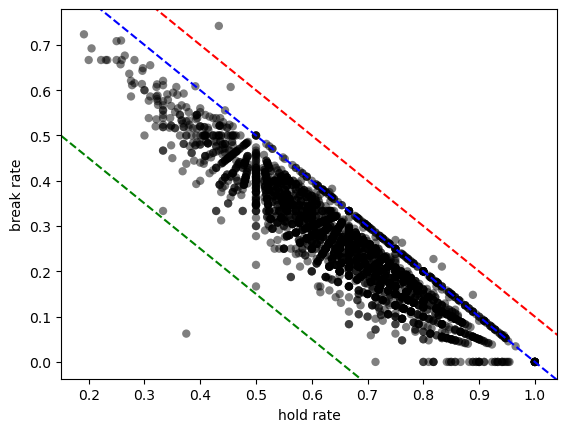

In [24]:
sns.scatterplot(x = data.home_hold_rate, y = data.away_break_rate, alpha=0.5, edgecolor='none', color='k')
sns.scatterplot(x = data.away_hold_rate, y = data.home_break_rate, alpha=0.5, edgecolor='none', color='k')
xlim = np.array(plt.xlim())
ylim = plt.ylim()
plt.plot(xlim,1-xlim, 'b--')
plt.plot(xlim,0.65-xlim, 'g--')
plt.plot(xlim,1.1-xlim, 'r--')
plt.xlim(xlim)
plt.ylim(ylim)
plt.xlabel('hold rate')
plt.ylabel('break rate')
plt.show()

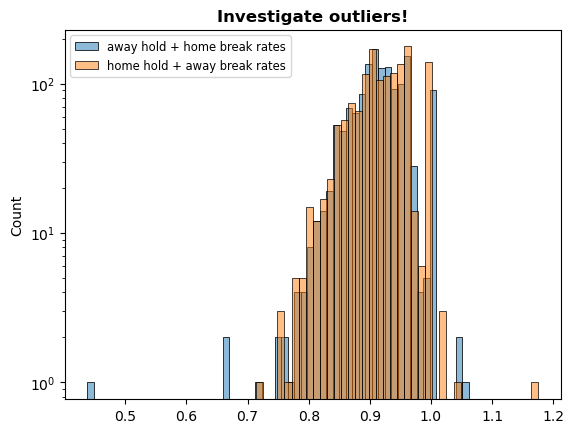

In [308]:
sns.histplot(ddata.away_hold_rate+ddata.home_break_rate, alpha=0.5, label='away hold + home break rates')
sns.histplot(ddata.home_hold_rate+ddata.away_break_rate, alpha=0.5, label='home hold + away break rates')
plt.legend(fontsize='small')
plt.yscale('log')
plt.show()

In [4]:
data[(data.home_hold_rate+data.away_break_rate > 1.1) | (data.away_hold_rate+data.home_break_rate > 1.1)]

,game,date,week,home,away,home_score,away_score,away_completions,away_throws,away_blocks,...,home_hold_rate,away_hold_rate,home_o_poss_per_hold,away_o_poss_per_hold,home_break_rate,away_break_rate,home_d_poss_per_pt,away_d_poss_per_pt,home_break_per_poss,away_break_per_poss
2062,2014-04-12-VAN-SLC,2014-04-12 19:00:00+00:00,1,Lions,Riptide,14,29,32,49,18,...,0.433333,0.375,3.384615,3.5,0.0625,0.741935,0.5625,0.935484,0.111111,0.793103


## Selected Features, Findings
## Fidings
 - Combine cleaned dataset and added features
   - save final data frames in `/data/`
 - Feature Selection Round 1:
   - looking at tables, distributions, correlation heatmaps, and pairplots above
   - remove obviously correlated features, provide subject knowledge justification

In [302]:
from sklearn.feature_selection import SelectKBest, f_regression, mutual_info_regression

In [294]:
X = data.drop(
        columns = ['game','date','week','home','away','home_score','away_score', 'home_margin','home_win']
)
y = data['home_margin']

In [295]:
X = pd.DataFrame(scale(X), columns=X.columns)

In [296]:
sk1 = SelectKBest(f_regression, k='all')
sk1.fit(X,y)

SelectKBest(k='all', score_func=<function f_regression at 0x000002809897D750>)

In [300]:
pd.DataFrame(sk1.scores_, index=sk1.get_feature_names_out()).sort_values(0)[0:10]

,0
away_completions,0.828060
home_o_scores,0.959004
home_completions,1.195680
away_throws,5.216587
home_throws,11.611988
away_o_scores,25.254868
home_completion_rate,55.056016
away_block_rate,91.740290
away_completion_rate,132.183243
home_block_rate,156.862048


In [298]:
pd.DataFrame(sk1.scores_, index=sk1.get_feature_names_out()).sort_values(0)[-5:]

,0
away_break_rate,1942.511621
away_hold_rate,2617.478708
home_break_rate,3106.118673
away_d_scores,3157.031705
home_d_scores,5728.158427


In [303]:
sk2 = SelectKBest(mutual_info_regression, k='all')
sk2.fit(X,y)

SelectKBest(k='all',
            score_func=<function mutual_info_regression at 0x00000280D1DBFBE0>)

In [308]:
pd.DataFrame(sk2.scores_, index=sk2.get_feature_names_out()).sort_values(0, ascending=False)[0:5]

,0
home_d_scores,0.894527
away_d_scores,0.713080
home_break_rate,0.629868
away_hold_rate,0.597934
away_break_rate,0.509360


In [309]:
pd.DataFrame(sk2.scores_, index=sk2.get_feature_names_out()).sort_values(0, ascending=True)[0:5]

,0
home_o_scores,0.000000
home_throws,0.004817
away_completions,0.022949
away_throws,0.027044
home_completions,0.034462


#### Combine Basic,Derived Features
- Make final adjustments to derived stats
 - combine data below

In [182]:
ddata.drop(columns=['home_margin','home_win'],inplace=True)

In [183]:
data = data.merge(ddata, left_index=True, right_index=True)

In [187]:
data.to_parquet('data/game_stats_0.parquet', engine='pyarrow', compression='gzip')

### Reload cleaned data

In [272]:
# adjustments, outlier investigation of derived data
data = pd.read_parquet('data/game_stats_0.parquet', engine='pyarrow')

In [87]:
# for derived feature plots
ddata = data[['home_margin', 'home_win', 'home_completion_rate',
       'away_completion_rate', 'home_block_rate', 'away_block_rate',
       'home_hold_rate', 'away_hold_rate', 'home_o_poss_per_hold',
       'away_o_poss_per_hold', 'home_break_rate', 'away_break_rate',
       'home_d_poss_per_pt', 'away_d_poss_per_pt', 'home_break_per_poss',
       'away_break_per_poss', 'home_throw_per_score', 'away_throw_per_score']]

In [163]:
data.shape

(1434, 45)

In [164]:
ddata.shape

(1434, 16)

## PCA
 - start with target feature = home margin, regression problem
 - PCA options, solver? LSA?
   - randomized SVD solver and TruncatedSVD same/similar results as default
 - Perform PCA, analyze results
   - feature analysis
   - drop huck and redzone features to reduce NA cull

In [226]:
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.preprocessing import scale, StandardScaler

In [247]:
X = data.drop(
        columns = ['game','date','week','home','away','home_score','away_score', 'home_margin','home_win']
)
y = data['home_margin']


In [191]:
X.columns

Index(['away_completions', 'away_throws', 'away_blocks', 'away_turnovers',
       'away_o_scores', 'away_o_points', 'away_o_possessions', 'away_d_scores',
       'away_d_points', 'away_d_possessions', 'home_completions',
       'home_throws', 'home_blocks', 'home_turnovers', 'home_o_scores',
       'home_o_points', 'home_o_possessions', 'home_d_scores', 'home_d_points',
       'home_d_possessions', 'home_completion_rate', 'away_completion_rate',
       'home_block_rate', 'away_block_rate', 'away_throw_per_score',
       'home_throw_per_score', 'home_hold_rate', 'away_hold_rate',
       'home_o_poss_per_hold', 'away_o_poss_per_hold', 'home_break_rate',
       'away_break_rate', 'home_d_poss_per_pt', 'away_d_poss_per_pt',
       'home_break_per_poss', 'away_break_per_poss'],
      dtype='object')

In [255]:
 # save for labelling
col_names = X.columns
#home_teams = data.loc[scaled_data_2.index,'home']

# scale
X = scale(X)
# save into df
scaled_df = pd.DataFrame(X, columns = col_names)

# confirm scaling
X.mean(), X.std(ddof=0)

(-3.8424151988271837e-17, 1.0)

### Comparing PCA Solvers

In [233]:
pca = TruncatedSVD(30).fit(X)

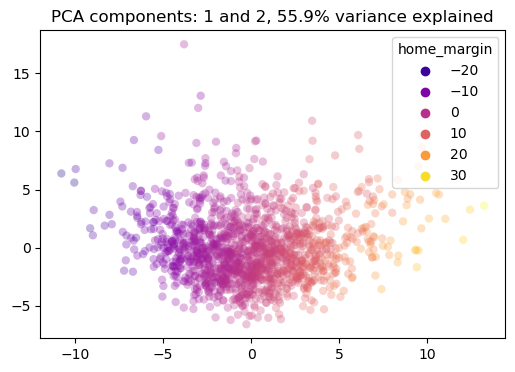

In [235]:
comp1 = 0 # similar plot below assumes one has been added
comp2 = 1

pca_var = 100*(pca.explained_variance_ratio_[comp1] + pca.explained_variance_ratio_[comp2])
                 
plt.subplots(figsize=(6,4))
sns.scatterplot(x= pca_x[:, comp1] ,y=pca_x[:, comp2], hue = y, #size=abs(y),
                alpha=0.3, palette='plasma', edgecolor='none')
plt.title(f'PCA components: {comp1+1} and {comp2+1}, {pca_var:.1f}% variance explained')
plt.show()

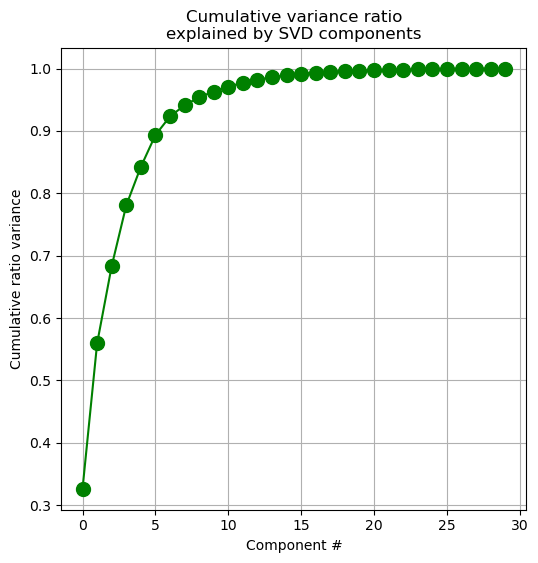

In [234]:
# plot explained variance cumulative sum
plt.subplots(figsize=(6, 6))
plt.plot(pca.explained_variance_ratio_.cumsum(), 'g-o', markersize=10)
plt.grid()
plt.xlabel('Component #')
plt.ylabel('Cumulative ratio variance')
plt.title('Cumulative variance ratio\nexplained by SVD components')
# plt.savefig('graphs/EDA/PCA/Explained_variance_cumsum.png')
plt.show()

In [232]:
components = 5
pca_contribution = pd.DataFrame(pca.components_, columns=col_names).iloc[0:components,:].T**2
pca_contribution = pd.DataFrame(pca_contribution.sum(axis=1)).rename(columns={0:'sq_sum'})
pca_contribution.sort_values('sq_sum', inplace=True)
pca_contribution.sort_values('sq_sum',ascending=False)[0:5]

,sq_sum
home_throws,0.285879
home_completions,0.279218
away_throws,0.268778
away_completions,0.254745
home_completion_rate,0.177447


### PCA 1

In [256]:
# fit pca
pca = PCA().fit(X)

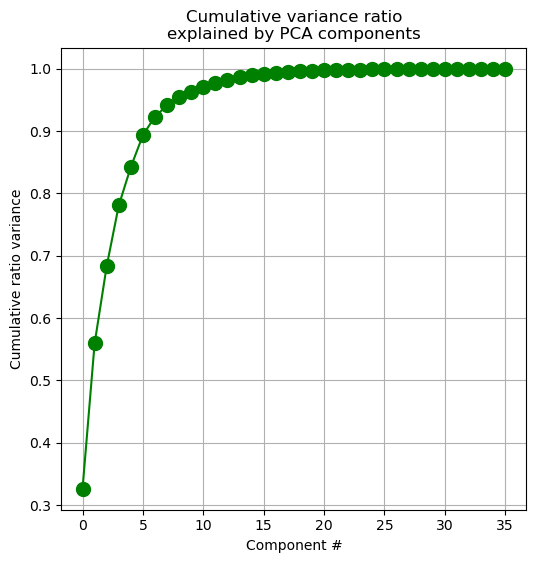

In [265]:
# plot explained variance cumulative sum
plt.subplots(figsize=(6, 6))
plt.plot(pca.explained_variance_ratio_.cumsum(), 'g-o', markersize=10)
plt.grid()
plt.xlabel('Component #')
plt.ylabel('Cumulative ratio variance')
plt.title('Cumulative variance ratio\nexplained by PCA components')
#plt.savefig('graphs/EDA/PCA/Explained_variance_cumsum.png')
plt.show()

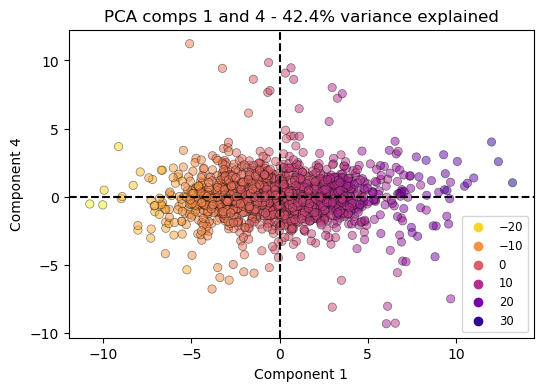

In [271]:
compA = 1
compB = 4

pc_var = round(100 * 
            (pca.explained_variance_ratio_[compA-1] 
             + pca.explained_variance_ratio_[compB-1])
               ,1)

a1 = pca_x[:, compA-1]
a2 = pca_x[:, compB-1]
#state = state_summary_index
#pc_var = 100 * pca.explained_variance_ratio_.cumsum()[1]
plt.subplots(figsize=(6,4))
sns.scatterplot(x=a1,y=a2, hue = y, 
                alpha=0.5, palette='plasma_r', edgecolor='k')
plt.xlabel(f'Component {compA}')
plt.ylabel(f'Component {compB}')
plt.title(f'PCA comps {compA} and {compB} - {pc_var}% variance explained')

xb = plt.xlim()
yb = plt.ylim()

plt.plot(xb, [0,0], 'k--')
plt.plot([0,0],yb, 'k--')

plt.xlim(xb)
plt.ylim(yb)

#plt.savefig(f'graphs/EDA/PCA/pca_scatter_{compA},{compB}.png')
plt.legend(fontsize='small')
plt.show()

In [257]:
components = 5
pca_contribution = pd.DataFrame(pca.components_, columns=col_names).iloc[0:components,:].T**2
pca_contribution = pd.DataFrame(pca_contribution.sum(axis=1)).rename(columns={0:'sq_sum'})
pca_contribution.sort_values('sq_sum', inplace=True)

In [264]:
pca_contribution.sort_values('sq_sum',ascending=False)[0:11]

,sq_sum
home_throws,0.285879
home_completions,0.279218
away_throws,0.268778
away_completions,0.254745
home_completion_rate,0.177447
home_o_scores,0.162621
away_completion_rate,0.162437
away_o_scores,0.160574
away_block_rate,0.156995
home_throw_per_score,0.153961


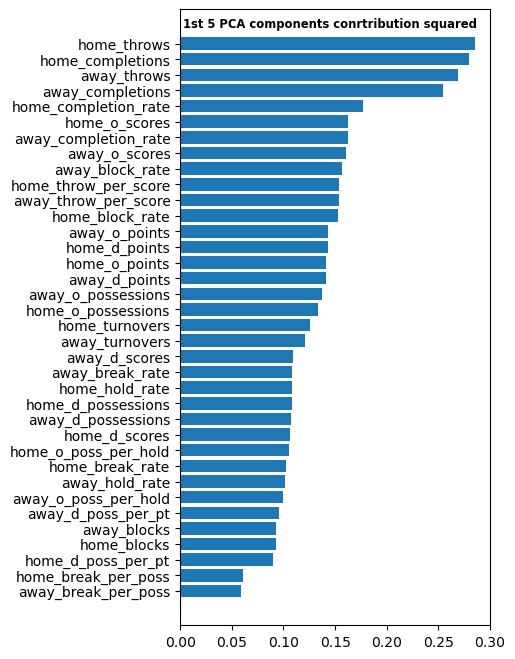

In [266]:
fig = plt.figure(figsize=(4,8), dpi=100)
plt.barh(y=pca_contribution.index, width = [val[0] for val in pca_contribution.values])
plt.suptitle('1st 5 PCA components conrtribution squared', fontsize='small', fontweight='bold', y = 0.87)
plt.savefig('graphs/EDA/PCA/Feature_PCA-component_contribution.png')
plt.show()

In [254]:
pd.DataFrame(pca.components_, columns=col_names).iloc[0:1,:]\
    .T.sort_values(0,ascending=False).style.background_gradient('PiYG', axis=None)

,0
home_throws,0.449041
home_completions,0.435884
home_throw_per_score,0.025053
home_turnovers,0.013158
away_turnovers,0.006973
away_d_possessions,0.006438
away_blocks,0.005805
home_d_possessions,0.004352
home_blocks,0.003536
home_o_possessions,0.003445


In [208]:
pd.DataFrame(pca.components_, columns=col_names).iloc[0:4,:].T.style\
    .background_gradient('PiYG', axis=None)

,0,1,2,3
away_completions,-0.014004,-0.152573,0.052530,0.355157
away_throws,0.012102,-0.119388,0.025469,0.368883
away_blocks,-0.124079,0.204289,-0.158478,0.037841
away_turnovers,0.164637,0.233570,-0.177510,0.021243
away_o_scores,-0.051937,-0.239611,-0.310696,0.011755
away_o_points,0.195327,-0.137026,-0.265380,0.012361
away_o_possessions,0.213458,0.024233,-0.287067,0.006367
away_d_scores,-0.240168,0.077765,-0.059246,0.008357
away_d_points,-0.205680,-0.113219,-0.271077,0.011808
away_d_possessions,-0.206417,0.191607,-0.125362,0.032541


In [209]:
pd.DataFrame(pca.components_, columns=col_names).iloc[1:2,:]\
    .T.sort_values(1,ascending=False).style.background_gradient('PiYG', axis=None)

,1
away_d_poss_per_pt,0.279913
home_turnovers,0.276258
home_o_poss_per_hold,0.259246
home_d_poss_per_pt,0.251162
away_turnovers,0.233570
away_o_poss_per_hold,0.209010
away_blocks,0.204289
away_d_possessions,0.191607
away_block_rate,0.176039
home_block_rate,0.169816


In [13]:
pca_x = pca.transform(X)

In [19]:
pca.explained_variance_ratio_[0]

0.32484236944583417

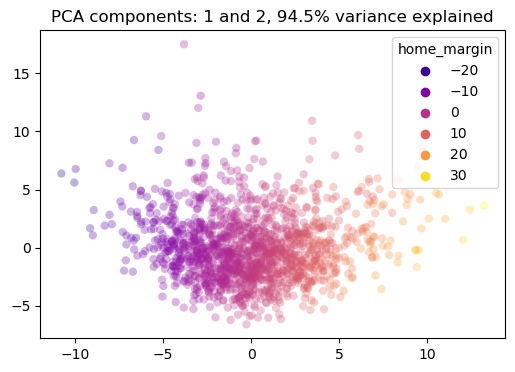

In [252]:
comp1 = 0 # similar plot below assumes one has been added
comp2 = 1

pca_var = 100*(pca.explained_variance_ratio_[comp1] + pca.explained_variance_ratio_[comp2])
                 
plt.subplots(figsize=(6,4))
sns.scatterplot(x= pca_x[:, comp1] ,y=pca_x[:, comp2], hue = y, #size=abs(y),
                alpha=0.3, palette='plasma', edgecolor='none')
plt.title(f'PCA components: {comp1+1} and {comp2+1}, {pca_var:.1f}% variance explained')
plt.show()

Text(0.5, 1.0, 'PCA first two components, 55.9% variance explained')

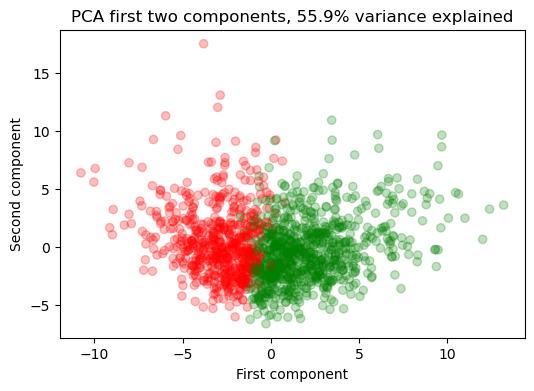

In [219]:
colors = ['g' if val else 'r' for val in data.home_win]
a1 = pca_x[:, 0]
a2 = pca_x[:, 1]
#state = state_summary_index
pc_var = 100 * pca.explained_variance_ratio_.cumsum()[1]
plt.subplots(figsize=(6,4))
plt.scatter(a1,a2, alpha=0.25, c=colors)

plt.xlabel('First component')
plt.ylabel('Second component')
plt.title(f'PCA first two components, {pc_var:.1f}% variance explained')

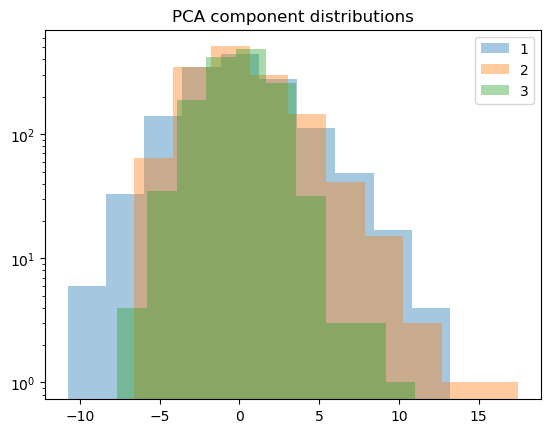

In [220]:
plt.hist(pca_x[:, 0], alpha=0.4, label='1')
plt.hist(pca_x[:, 1], alpha=0.4, label='2')
plt.hist(pca_x[:, 2], alpha=0.4, label='3')
plt.title('PCA component distributions')
plt.yscale('log')
plt.legend()
plt.show()

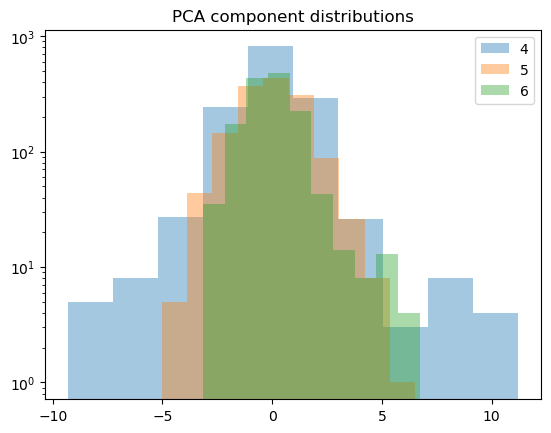

In [221]:
plt.hist(pca_x[:, 3], alpha=0.4, label='4')
plt.hist(pca_x[:, 4], alpha=0.4, label='5')
plt.hist(pca_x[:, 5], alpha=0.4, label='6')
plt.title('PCA component distributions')
plt.yscale('log')
plt.legend()
plt.show()

#### Try again, group by TEAM / YEAR

## Correlation Heatmaps with Plotly

In [239]:
import plotly.express as px

In [236]:
# reloaded combined basic and derived features as "data"
data = pd.read_parquet('data/game_stats_0.parquet', engine='pyarrow')

# "basic" features after score: cols 7-26
# "target" features: cols 27-28
# "derived" features: cols 29-44

In [237]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1428 entries, 2057 to 3232
Data columns (total 45 columns):
 #   Column                Non-Null Count  Dtype              
---  ------                --------------  -----              
 0   game                  1428 non-null   object             
 1   date                  1428 non-null   datetime64[ns, UTC]
 2   week                  1428 non-null   category           
 3   home                  1428 non-null   category           
 4   away                  1428 non-null   category           
 5   home_score            1428 non-null   int32              
 6   away_score            1428 non-null   int32              
 7   away_completions      1428 non-null   int32              
 8   away_throws           1428 non-null   int32              
 9   away_blocks           1428 non-null   int32              
 10  away_turnovers        1428 non-null   int32              
 11  away_o_scores         1428 non-null   int32              
 12  awa

In [238]:
data.iloc[:,7:44].corr()[abs(data.iloc[:,7:44].corr()) >=0.5]

,away_completions,away_throws,away_blocks,away_turnovers,away_o_scores,away_o_points,away_o_possessions,away_d_scores,away_d_points,away_d_possessions,...,home_throw_per_score,home_hold_rate,away_hold_rate,home_o_poss_per_hold,away_o_poss_per_hold,home_break_rate,away_break_rate,home_d_poss_per_pt,away_d_poss_per_pt,home_break_per_poss
away_completions,1.000000,0.987809,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
away_throws,0.987809,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
away_blocks,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.701207,...,NaN,-0.503713,NaN,0.600274,NaN,NaN,NaN,NaN,0.632190,-0.514906
away_turnovers,NaN,NaN,NaN,1.000000,NaN,NaN,0.723572,NaN,NaN,NaN,...,NaN,NaN,-0.592302,NaN,0.777763,0.598308,NaN,0.828655,NaN,NaN
away_o_scores,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,0.700585,NaN,...,NaN,NaN,0.547619,NaN,-0.611487,NaN,NaN,-0.547470,NaN,NaN
away_o_points,NaN,NaN,NaN,NaN,NaN,1.000000,0.803230,NaN,NaN,NaN,...,-0.731811,0.672121,NaN,-0.644565,NaN,NaN,-0.620223,NaN,-0.558953,NaN
away_o_possessions,NaN,NaN,NaN,0.723572,NaN,0.803230,1.000000,NaN,NaN,NaN,...,-0.595458,0.556822,-0.517194,NaN,0.569505,0.565125,-0.555079,0.557102,NaN,NaN
away_d_scores,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.694989,0.773002,...,NaN,-0.840624,NaN,0.612205,NaN,NaN,0.924961,NaN,NaN,NaN
away_d_points,NaN,NaN,NaN,NaN,0.700585,NaN,NaN,0.694989,1.000000,NaN,...,NaN,NaN,0.701498,NaN,-0.668892,-0.662089,NaN,-0.577810,NaN,NaN
away_d_possessions,NaN,NaN,0.701207,NaN,NaN,NaN,NaN,0.773002,NaN,1.000000,...,NaN,-0.742593,NaN,0.840273,NaN,NaN,0.745705,NaN,0.847355,NaN


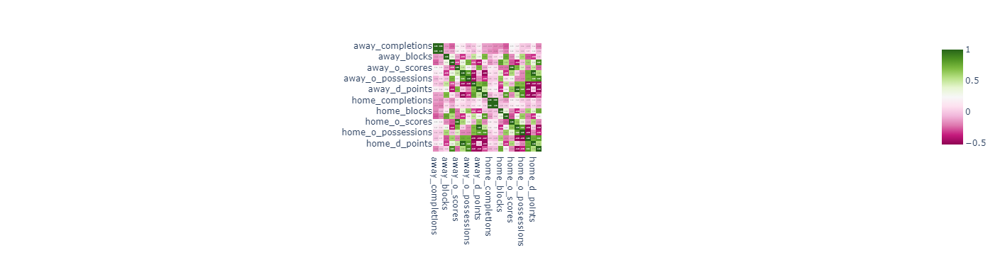

In [243]:
fig = px.imshow(data.iloc[:,7:27].corr(), text_auto=".2f", color_continuous_scale='PiYG',
               )
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=12,
        font_family="Helvetica"
        
    ),
)

fig.write_html('graphs/EDA/plotly_heatmap_basic.html')
fig.show()

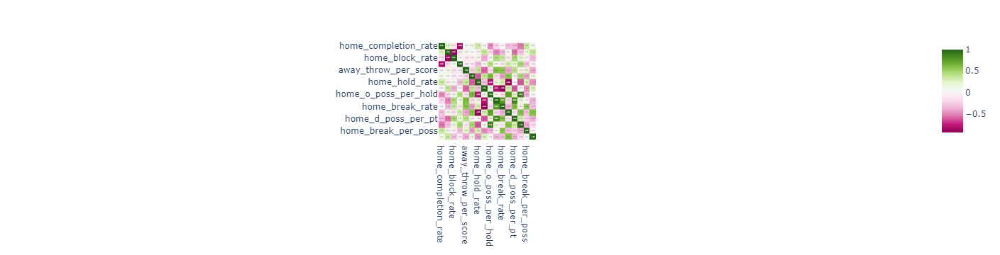

In [244]:
fig = px.imshow(data.iloc[:,29:].corr(), text_auto=".2f", color_continuous_scale='PiYG',
               )
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=12,
        font_family="Helvetica"
        
    ),
)

fig.write_html('graphs/EDA/plotly_heatmap_derived.html')
fig.show()

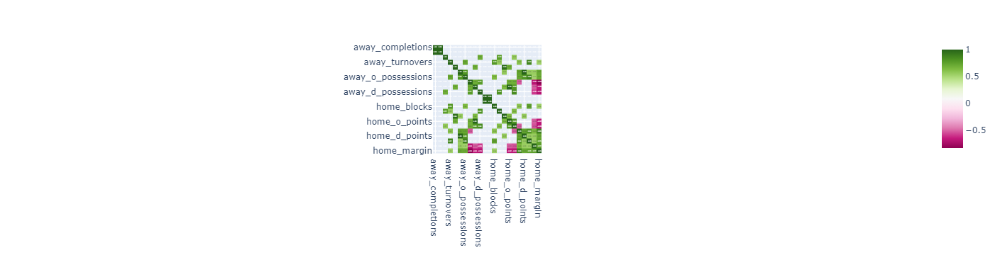

In [245]:
fig = px.imshow(data.iloc[:,7:29].corr()[abs(data.iloc[:,7:29].corr()) >=0.5], text_auto=".2f", color_continuous_scale='PiYG',
               )
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=12,
        font_family="Helvetica"
        
    ),
)

fig.write_html('graphs/EDA/plotly_heatmap_basic_focused.html')
fig.show()

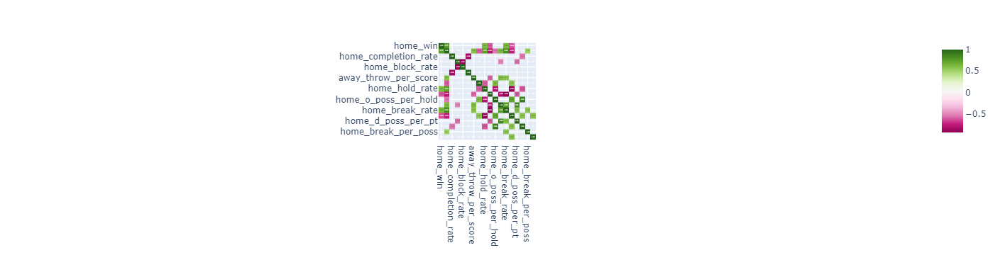

In [246]:


fig = px.imshow(data.iloc[:,27:].corr()[abs(data.iloc[:,27:].corr()) >=0.5], text_auto=".2f", color_continuous_scale='PiYG',
               )
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=12,
        font_family="Helvetica"
        
    ),
)

fig.write_html('graphs/EDA/plotly_heatmap_derived+target_focused.html')
fig.show()

## ydata-report

**Only minimal report generates a readable file, <10MB. Splitting into two column groupings helped a bit. I will use the graphs/tables I've produced to continue with EDA, and let the ydata reports be an exercise.**

*separate environment*
 | Package | Version |
|---------|-------|
| **numpy** | 1.23.5 |
| **pandas** | 1.5.3 |
| **python** | 3.11.3 |
| ***ydata_profiling*** | 4.1.1 |

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1359 entries, 2059 to 3016
Data columns (total 57 columns):
 #   Column                Non-Null Count  Dtype              
---  ------                --------------  -----              
 0   game                  1359 non-null   object             
 1   date                  1359 non-null   datetime64[ns, UTC]
 2   tz                    1359 non-null   object             
 3   location              656 non-null    float64            
 4   week                  1359 non-null   category           
 5   home                  1359 non-null   category           
 6   away                  1359 non-null   category           
 7   home_score            1359 non-null   int32              
 8   away_score            1359 non-null   int32              
 9   away_completions      1353 non-null   float64            
 10  away_throws           1353 non-null   float64            
 11  away_hucks_completed  373 non-null    float64            
 12  awa

In [2]:
from ydata_profiling import ProfileReport

In [ ]:
report = ProfileReport(df,minimal=True, html={'style':{'full_width': True}})
report.to_file("graphs/EDA/ydata_report_minimal.html")

***I DO NOT RECOMMEND GENERATING REPORTS BELOW***

In [6]:
report = ProfileReport(df, html={'style':{'full_width': True}})
report.to_file("graphs/EDA/ydata_report.html")
report = ProfileReport(df, explorative=True, html={'style':{'full_width': True}})
report.to_file("graphs/EDA/ydata_report_explorative.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
report = ProfileReport(df.iloc[:,5:39], html={'style':{'full_width': True}})
report.to_file("graphs/EDA/ydata_report_col_5-38.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
report = ProfileReport(df.iloc[:,37:57], html={'style':{'full_width': True, 'theme':'flatly'}})
report.to_file("graphs/EDA/ydata_report_col_37-56.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]